In [1]:
import matplotlib.pyplot as plt
from highlight_text import fig_text
import numpy as np
import pandas as pd
import os
pd.set_option('display.max_columns', None)
from soccerplots.radar_chart import Radar
from soccerplots.utils import add_image
from mplsoccer import PyPizza, FontManager
from mplsoccer import Radar, FontManager, grid
import warnings
warnings.filterwarnings('ignore')

In [2]:
player = 'Harry Kane'
per_90s = 187.7
final_dir = f"D:/Personal/Football Analysis/Analysis/Player Analysis/final_data"
current_dir = os.getcwd()

In [3]:
current_dir

'C:\\Users\\saransh.s\\Downloads\\Notebooks\\Analysis\\Clean Codes'

In [4]:
stats = ['standard_stats','shooting_stats','passing_stats','passing_types_stats',
         'gca_stats','defense_stats','possession_stats','playing_time_stats',
         'misc_stats']

In [5]:
os.chdir(final_dir)

In [6]:
df = pd.read_csv('defense_stats.csv')
df

,Unnamed: 0.2,Unnamed: 0.1,Unnamed: 0,Player,Span,Nation,Pos,Squad,90s,Tkl,TklW,Def 3rd,Mid 3rd,Att 3rd,Tkl.1,Att,Tkl%,Lost,Blocks,Sh,Pass,Int,Tkl+Int,Clr,Err
0,0,0.0,0,Harry Kane,Career,eng ENG,FW,Tottenham,187.7,91.0,55.0,10.0,58.0,23.0,29.0,102.0,168.7,73.0,120.0,41.0,79.0,27.0,118.0,155.0,0.0
1,1,1.0,0,Dušan Vlahović,Career,rs SRB,FW,3 squads,104.5,31.0,10.0,4.0,13.0,14.0,14.0,51.0,27.5,37.0,39.0,8.0,31.0,15.0,46.0,54.0,1.0
2,2,2.0,1,Randal Kolo Muani,Career,fr FRA,FW,2 squads,89.5,64.0,37.0,12.0,26.0,26.0,18.0,59.0,30.5,41.0,45.0,6.0,39.0,16.0,80.0,67.0,0.0
3,3,3.0,2,Loïs Openda,Career,be BEL,FW,3 squads,85.0,45.0,31.0,10.0,23.0,12.0,18.0,60.0,30.0,42.0,40.0,1.0,39.0,17.0,62.0,5.0,0.0
4,4,4.0,3,Giacomo Raspadori,Career,it ITA,DF,2 squads,54.0,50.0,34.0,11.0,23.0,16.0,16.0,52.0,30.8,36.0,53.0,8.0,45.0,14.0,64.0,23.0,0.0
5,5,5.0,4,Josip Brekalo,Career,hr CRO,"FW,MF",5 squads,112.1,101.0,56.0,42.0,35.0,24.0,33.0,116.0,28.4,83.0,100.0,4.0,96.0,59.0,159.0,29.0,3.0
6,6,6.0,5,Moise Kean,Career,it ITA,FW,4 squads,68.5,42.0,29.0,12.0,20.0,10.0,13.0,41.0,31.7,28.0,25.0,1.0,24.0,29.0,71.0,26.0,2.0
7,7,NaN,0,Jonathan David,Career,ca CAN,FW,Lille,82.8,57.0,30.0,16.0,23.0,18.0,25.0,72.0,106.4,47.0,49.0,7.0,42.0,14.0,71.0,36.0,0.0
8,8,NaN,0,Dominic Calvert-Lewin,Career,eng ENG,FW,Everton,124.2,66.0,37.0,12.0,24.0,30.0,20.0,64.0,182.5,44.0,73.0,14.0,59.0,33.0,99.0,128.0,1.0
9,9,NaN,0,Patrik Schick,Career,cz CZE,"FW,MF",Roma,94.3,39.0,19.0,7.0,20.0,12.0,6.0,51.0,74.7,45.0,56.0,8.0,48.0,14.0,53.0,98.0,1.0


In [7]:
comp_dir = f"C:/Users/saransh.s/Downloads/Notebooks/Analysis/Clean Codes/Comparisions/{player}"
def_dir =f"C:/Users/saransh.s/Downloads/Notebooks/Analysis/Clean Codes/Comparisions/{player}/def"
goals_shots_dir = f"C:/Users/saransh.s/Downloads/Notebooks/Analysis/Clean Codes/Comparisions/{player}/goals_shots"
final_pass_carry_dir = f"C:/Users/saransh.s/Downloads/Notebooks/Analysis/Clean Codes/Comparisions/{player}/final_pass_carry"


# create the english directory if it doesn't exist
if not os.path.exists(comp_dir):
    os.mkdir(comp_dir)
    
if not os.path.exists(def_dir):
    os.mkdir(def_dir)
    
if not os.path.exists(goals_shots_dir):
    os.mkdir(goals_shots_dir)

if not os.path.exists(final_pass_carry_dir):
    os.mkdir(final_pass_carry_dir)

In [8]:
os.chdir(comp_dir)

In [9]:
df.drop(['Unnamed: 0.1','Unnamed: 0','Span','Pos','Squad','Tkl%','Tkl+Int','Err'],axis=1,inplace=True)

In [10]:
df.drop(['Unnamed: 0.2'],axis=1,inplace=True)

In [11]:
df.head()

,Player,Nation,90s,Tkl,TklW,Def 3rd,Mid 3rd,Att 3rd,Tkl.1,Att,Lost,Blocks,Sh,Pass,Int,Clr
0,Harry Kane,eng ENG,187.7,91.0,55.0,10.0,58.0,23.0,29.0,102.0,73.0,120.0,41.0,79.0,27.0,155.0
1,Dušan Vlahović,rs SRB,104.5,31.0,10.0,4.0,13.0,14.0,14.0,51.0,37.0,39.0,8.0,31.0,15.0,54.0
2,Randal Kolo Muani,fr FRA,89.5,64.0,37.0,12.0,26.0,26.0,18.0,59.0,41.0,45.0,6.0,39.0,16.0,67.0
3,Loïs Openda,be BEL,85.0,45.0,31.0,10.0,23.0,12.0,18.0,60.0,42.0,40.0,1.0,39.0,17.0,5.0
4,Giacomo Raspadori,it ITA,54.0,50.0,34.0,11.0,23.0,16.0,16.0,52.0,36.0,53.0,8.0,45.0,14.0,23.0


In [12]:
os.chdir(final_dir)

In [13]:
df3 = pd.read_csv('misc_stats.csv')
df3.head()

,Unnamed: 0.2,Unnamed: 0.1,Unnamed: 0,Player,Span,Nation,Pos,Squad,90s,CrdY,CrdR,2CrdY,Fls,Fld,Off,Crs,Int,TklW,PKwon,PKcon,OG,Recov,Won,Lost,Won%
0,0,0.0,0,Harry Kane,Career,eng ENG,FW,Tottenham,187.7,24.0,0.0,0.0,195.0,290.0,113.0,161.0,27.0,55.0,6.0,0.0,0.0,437.0,375.0,501.0,259.9
1,1,1.0,0,Dušan Vlahović,Career,rs SRB,FW,3 squads,104.5,11.0,1.0,0.0,120.0,206.0,82.0,66.0,15.0,10.0,3.0,0.0,0.0,252.0,240.0,302.0,44.3
2,2,2.0,1,Randal Kolo Muani,Career,fr FRA,FW,2 squads,89.5,10.0,1.0,1.0,170.0,203.0,61.0,68.0,16.0,37.0,7.0,1.0,0.0,303.0,192.0,314.0,37.9
3,3,3.0,2,Loïs Openda,Career,be BEL,FW,3 squads,85.0,7.0,2.0,0.0,101.0,155.0,56.0,109.0,17.0,31.0,0.0,0.0,0.0,205.0,63.0,105.0,37.5
4,4,4.0,3,Giacomo Raspadori,Career,it ITA,DF,2 squads,54.0,11.0,1.0,1.0,44.0,67.0,10.0,123.0,14.0,34.0,5.0,0.0,0.0,187.0,14.0,39.0,26.4


In [14]:
df['Recoveries'] = df3['Recov']
df['Aerial Duels Won']=df3['Won']
df['Aerial Duels Lost'] = df3['Lost']
df.head()

,Player,Nation,90s,Tkl,TklW,Def 3rd,Mid 3rd,Att 3rd,Tkl.1,Att,Lost,Blocks,Sh,Pass,Int,Clr,Recoveries,Aerial Duels Won,Aerial Duels Lost
0,Harry Kane,eng ENG,187.7,91.0,55.0,10.0,58.0,23.0,29.0,102.0,73.0,120.0,41.0,79.0,27.0,155.0,437.0,375.0,501.0
1,Dušan Vlahović,rs SRB,104.5,31.0,10.0,4.0,13.0,14.0,14.0,51.0,37.0,39.0,8.0,31.0,15.0,54.0,252.0,240.0,302.0
2,Randal Kolo Muani,fr FRA,89.5,64.0,37.0,12.0,26.0,26.0,18.0,59.0,41.0,45.0,6.0,39.0,16.0,67.0,303.0,192.0,314.0
3,Loïs Openda,be BEL,85.0,45.0,31.0,10.0,23.0,12.0,18.0,60.0,42.0,40.0,1.0,39.0,17.0,5.0,205.0,63.0,105.0
4,Giacomo Raspadori,it ITA,54.0,50.0,34.0,11.0,23.0,16.0,16.0,52.0,36.0,53.0,8.0,45.0,14.0,23.0,187.0,14.0,39.0


In [15]:
os.chdir(comp_dir)

In [16]:
all_players = df['Player'].tolist()
all_players = all_players[1:]
all_90s = df['90s'].tolist()
all_90s=all_90s[1:]

In [17]:
all_90s

[104.5,
 89.5,
 85.0,
 54.0,
 112.1,
 68.5,
 82.8,
 124.2,
 94.3,
 143.99999999999997,
 126.8,
 100.0]

In [18]:
player1_df = df.iloc[0:1,2:]
player1_df = player1_df.div(player1_df['90s'],axis=0)
player1_df_value = player1_df.iloc[:,1:].values.tolist()
player1_df_value =player1_df_value[0]
player1_df_value

[0.4848161960575387,
 0.2930207778369739,
 0.053276505061267986,
 0.3090037293553543,
 0.12253596164091636,
 0.15450186467767715,
 0.5434203516249334,
 0.3889184869472563,
 0.6393180607352158,
 0.21843367075119874,
 0.42088438998401706,
 0.14384656366542356,
 0.8257858284496538,
 2.328183271177411,
 1.9978689397975493,
 2.669152903569526]

In [19]:
URL1 = ('https://raw.githubusercontent.com/googlefonts/SourceSerifProGFVersion/main/fonts/'
        'SourceSerifPro-Regular.ttf')
serif_regular = FontManager(URL1)
URL2 = ('https://raw.githubusercontent.com/googlefonts/SourceSerifProGFVersion/main/fonts/'
        'SourceSerifPro-ExtraLight.ttf')
serif_extra_light = FontManager(URL2)
URL3 = ('https://raw.githubusercontent.com/google/fonts/main/ofl/rubikmonoone/'
        'RubikMonoOne-Regular.ttf')
rubik_regular = FontManager(URL3)
URL4 = 'https://raw.githubusercontent.com/googlefonts/roboto/main/src/hinted/Roboto-Thin.ttf'
robotto_thin = FontManager(URL4)
URL5 = ('https://raw.githubusercontent.com/google/fonts/main/apache/robotoslab/'
        'RobotoSlab%5Bwght%5D.ttf')
robotto_bold = FontManager(URL5)

In [20]:
player1_df

,90s,Tkl,TklW,Def 3rd,Mid 3rd,Att 3rd,Tkl.1,Att,Lost,Blocks,Sh,Pass,Int,Clr,Recoveries,Aerial Duels Won,Aerial Duels Lost
0,1.0,0.484816,0.293021,0.053277,0.309004,0.122536,0.154502,0.54342,0.388918,0.639318,0.218434,0.420884,0.143847,0.825786,2.328183,1.997869,2.669153


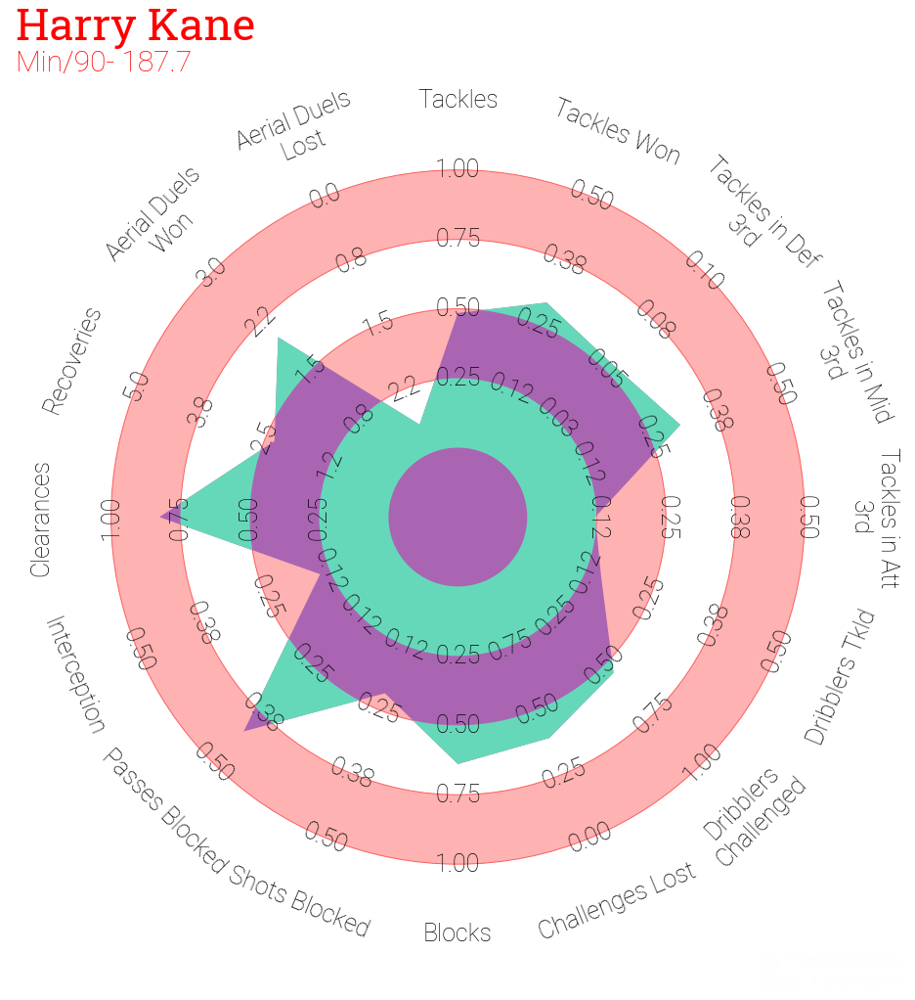

In [21]:
player1_df = df.iloc[0:1,2:]
player1_df = player1_df.div(player1_df['90s'],axis=0)
player1_df_value = player1_df.iloc[:,1:].values.tolist()
player1_df_value =player1_df_value[0]
player1_df_value

params = ['Tackles','Tackles Won','Tackles in Def 3rd','Tackles in Mid 3rd','Tackles in Att 3rd'
              ,'Dribblers Tkld','Dribblers Challenged','Challenges Lost'
              ,'Blocks','Shots Blocked','Passes Blocked','Interception','Clearances','Recoveries','Aerial Duels Won',
          'Aerial Duels Lost']

low = [0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0]
high =[1,0.5,0.1,0.5,0.5,0.5,1,1,1,0.5,0.5,0.5,1,5,3,3]

lower_is_better = ['Challenges Lost','Aerial Duels Lost']

radar = Radar(params, low, high,
          lower_is_better=lower_is_better,
          # whether to round any of the labels to integers instead of decimal places
          round_int=[False]*len(params),
          num_rings=4,  # the number of concentric circles (excluding center circle)
          # if the ring_width is more than the center_circle_radius then
          # the center circle radius will be wider than the width of the concentric circles
          ring_width=1, center_circle_radius=1)


fig, axs = grid(figheight=14, grid_height=0.915, title_height=0.06, endnote_height=0.025,
                title_space=0, endnote_space=0, grid_key='radar', axis=False)

# plot the radar
radar.setup_axis(ax=axs['radar'])
rings_inner = radar.draw_circles(ax=axs['radar'], facecolor='#ffb2b2', edgecolor='#fc5f5f')
radar_output = radar.draw_radar(player1_df_value, ax=axs['radar'],
                                kwargs_radar={'facecolor': '#aa65b2'},
                                kwargs_rings={'facecolor': '#66d8ba'})
radar_poly, rings_outer, vertices = radar_output
range_labels = radar.draw_range_labels(ax=axs['radar'], fontsize=25,
                                       fontproperties=robotto_thin.prop)
param_labels = radar.draw_param_labels(ax=axs['radar'], fontsize=25,
                                       fontproperties=robotto_thin.prop)

# adding the endnote and title text (these axes range from 0-1, i.e. 0, 0 is the bottom left)
# Note we are slightly offsetting the text from the edges by 0.01 (1%, e.g. 0.99)
endnote_text = axs['endnote'].text(0.99, 0.9, "By Poetic Scales\nData : Fbref.com", fontsize=20,color='#fcfcfc',
                                       fontproperties=robotto_thin.prop, ha='right', va='center')
title1_text = axs['title'].text(0.01, 0.65, player, fontsize=45, color='red',
                                fontproperties=robotto_bold.prop, ha='left', va='center')

title2_text = axs['title'].text(0.01, 0.05, f"Min/90- {per_90s}", fontsize=30,
                            fontproperties=robotto_thin.prop,
                            ha='left', va='center', color='red')
os.chdir(def_dir)
plt.savefig(f"{player}_def.png")

In [22]:
def comp_radar_chart(similar_player):
    player2_df = df.loc[df['Player']==similar_player]
    player2_90s = player2_df['90s']
    
    player2_df = player2_df.iloc[:,2:]
    player2_df = player2_df.div(player2_df['90s'],axis=0)
    player2_df_value = player2_df.iloc[:,1:].values.tolist()
    player2_df_value =player2_df_value[0]
    
    
    
    params = ['Tackles','Tackles Won','Tackles in Def 3rd','Tackles in Mid 3rd','Tackles in Att 3rd'
                  ,'Dribblers Tkld','Dribblers Challenged','Challenges Lost'
                  ,'Blocks','Shots Blocked','Passes Blocked','Interception','Clearances','Recoveries','Aerial Duels Won',
              'Aerial Duels Lost']

    low = [0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0]
    high =[1,0.5,0.1,0.5,0.5,0.5,1,1,1,0.5,0.5,0.5,1,5,3,3]

    lower_is_better = ['Challenges Lost','Aerial Duels Lost']

    radar = Radar(params, low, high,
              lower_is_better=lower_is_better,
              # whether to round any of the labels to integers instead of decimal places
              round_int=[False]*len(params),
              num_rings=4,  # the number of concentric circles (excluding center circle)
              # if the ring_width is more than the center_circle_radius then
              # the center circle radius will be wider than the width of the concentric circles
              ring_width=1, center_circle_radius=1)
    
    fig, axs = grid(figheight=14, grid_height=0.915, title_height=0.06, endnote_height=0.025,
                title_space=0, endnote_space=0, grid_key='radar', axis=False)

    # plot radar
    radar.setup_axis(ax=axs['radar'],facecolor='None')  # format axis as a radar
    rings_inner = radar.draw_circles(ax=axs['radar'], facecolor='#ffb2b2', edgecolor='#fc5f5f')
    radar_output = radar.draw_radar_compare(player1_df_value,player2_df_value, ax=axs['radar'],
                                            kwargs_radar={'facecolor': 'red', 'alpha': 0.6},
                                            kwargs_compare={'facecolor': '#01c49d', 'alpha': 0.6})
    radar_poly, radar_poly2, vertices1, vertices2 = radar_output
    range_labels = radar.draw_range_labels(ax=axs['radar'], fontsize=29,color='#fcfcfc',
                                           fontproperties=robotto_thin.prop)
    param_labels = radar.draw_param_labels(ax=axs['radar'], fontsize=25,color='#fcfcfc',
                                           fontproperties=robotto_thin.prop)
    axs['radar'].scatter(vertices1[:, 0], vertices1[:, 1],
                         c='#00f2c1', edgecolors='#6d6c6d', marker='o', s=150, zorder=2)
    axs['radar'].scatter(vertices2[:, 0], vertices2[:, 1],
                         c='#d80499', edgecolors='#6d6c6d', marker='o', s=150, zorder=2)

    # adding the endnote and title text (these axes range from 0-1, i.e. 0, 0 is the bottom left)
    # Note we are slightly offsetting the text from the edges by 0.01 (1%, e.g. 0.99)
    endnote_text = axs['endnote'].text(0.99, 0.9, "By Poetic Scales\nData : Fbref.com", fontsize=20,color='#fcfcfc',
                                       fontproperties=robotto_thin.prop, ha='right', va='center')
    title1_text = axs['title'].text(0.01, 0.65, player, fontsize=45, color='red',
                                    fontproperties=robotto_bold.prop, ha='left', va='center')
    
    title2_text = axs['title'].text(0.01, 0.05, f"Min/90- {per_90s}", fontsize=30,
                                fontproperties=robotto_thin.prop,
                                ha='left', va='center', color='red')

    title3_text = axs['title'].text(0.99, 0.65, similar_player, fontsize=35,
                                    fontproperties=robotto_bold.prop,
                                    ha='right', va='center', color='#01c49d')
    title4_text = axs['title'].text(0.99, 0.05, f"Min/90- {float(player2_90s)}", fontsize=30,
                                fontproperties=robotto_thin.prop,
                                ha='right', va='center', color='#01c49d')
    fig.set_facecolor('#121212')
    plt.savefig(f"vs {similar_player}_def.png")

In [23]:
df['Player'].unique()

array(['Harry Kane', 'Dušan Vlahović', 'Randal Kolo Muani', 'Loïs Openda',
       'Giacomo Raspadori', 'Josip Brekalo', 'Moise Kean',
       'Jonathan David', 'Dominic Calvert-Lewin', 'Patrik Schick',
       'Tammy Abraham', 'Marcus Thuram', 'Ivan Toney'], dtype=object)

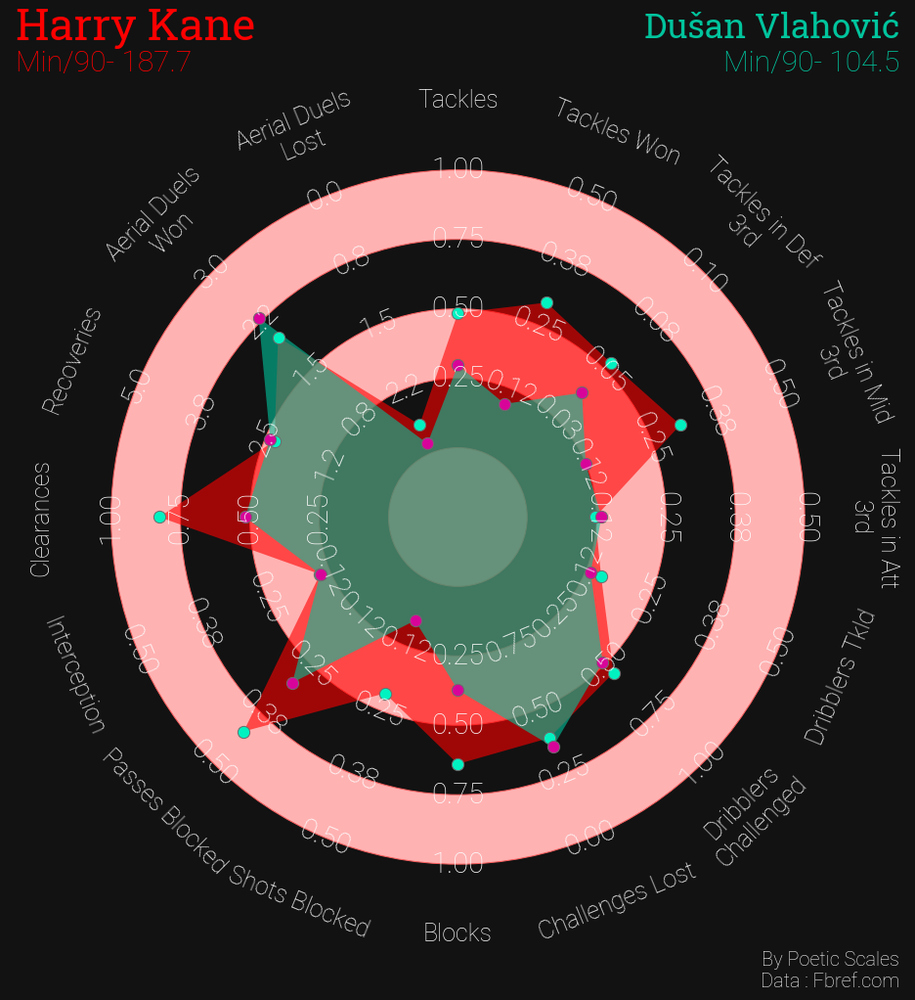

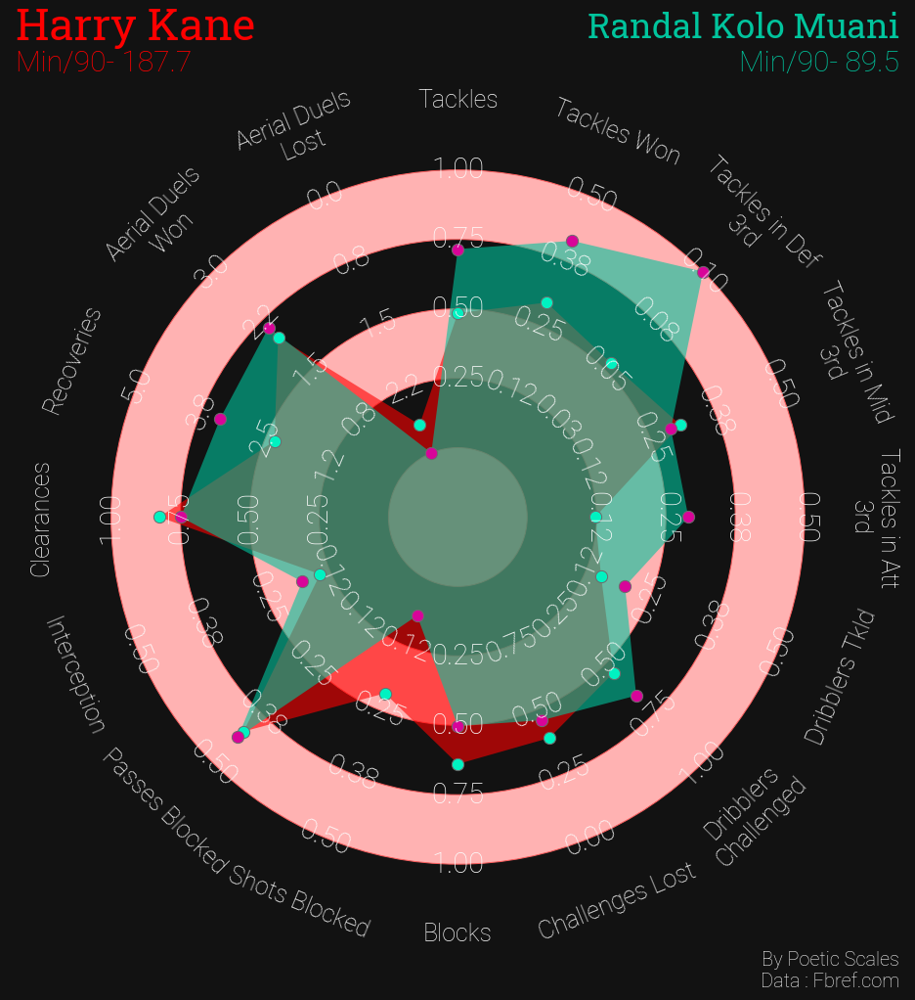

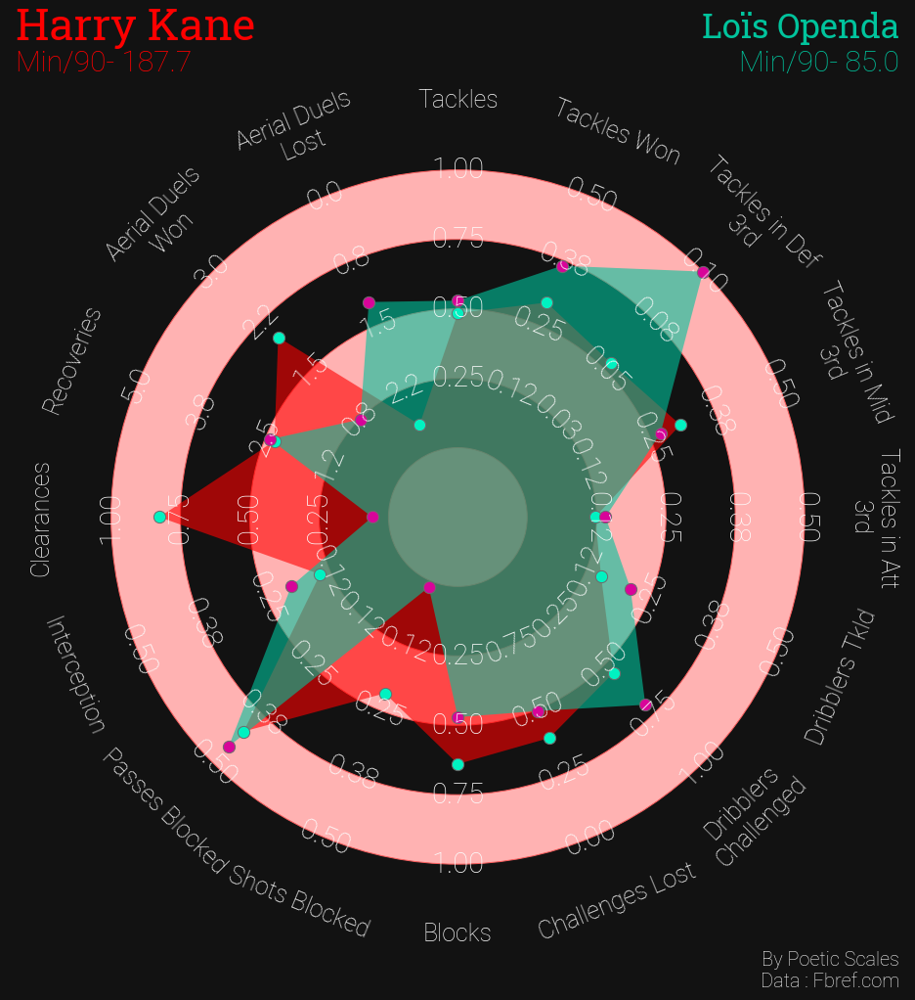

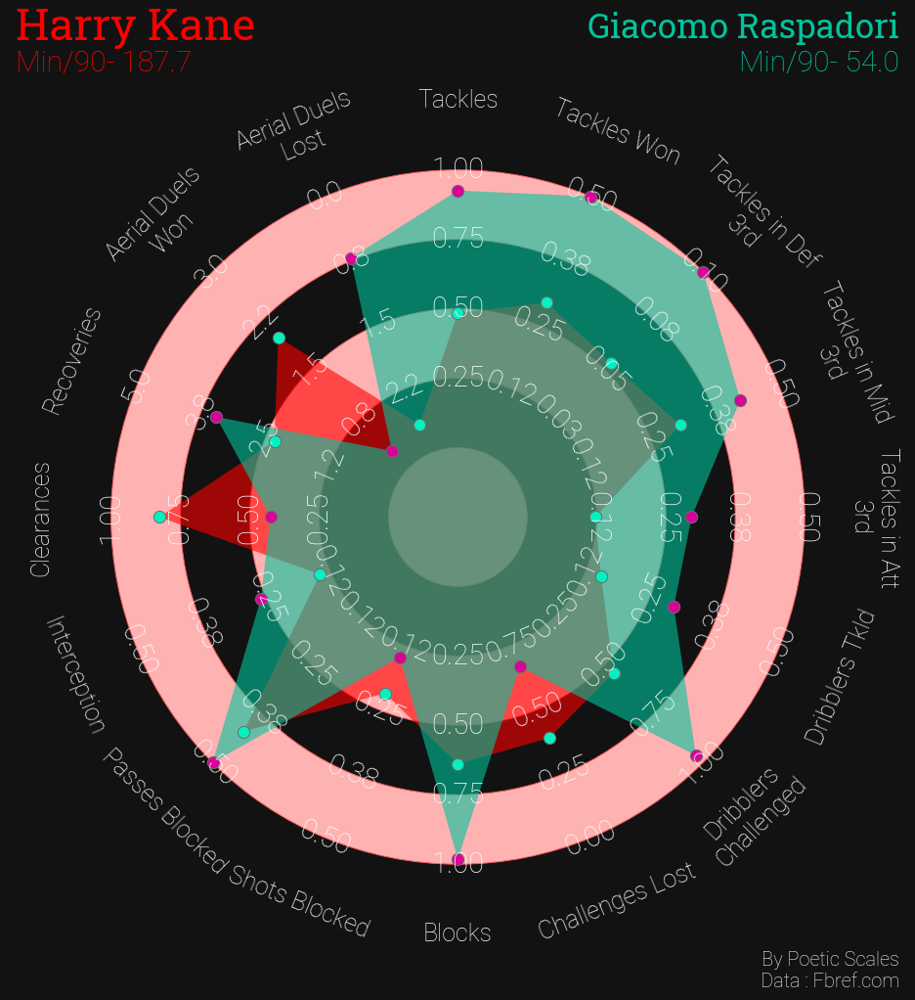

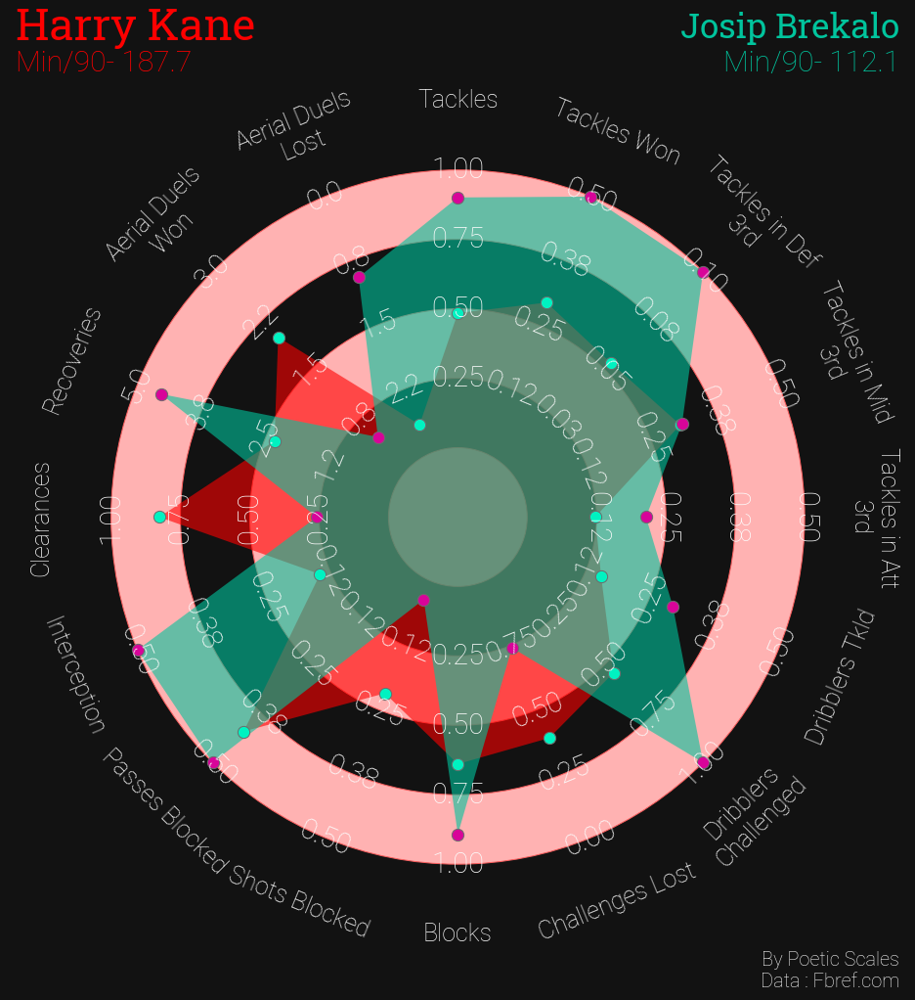

...

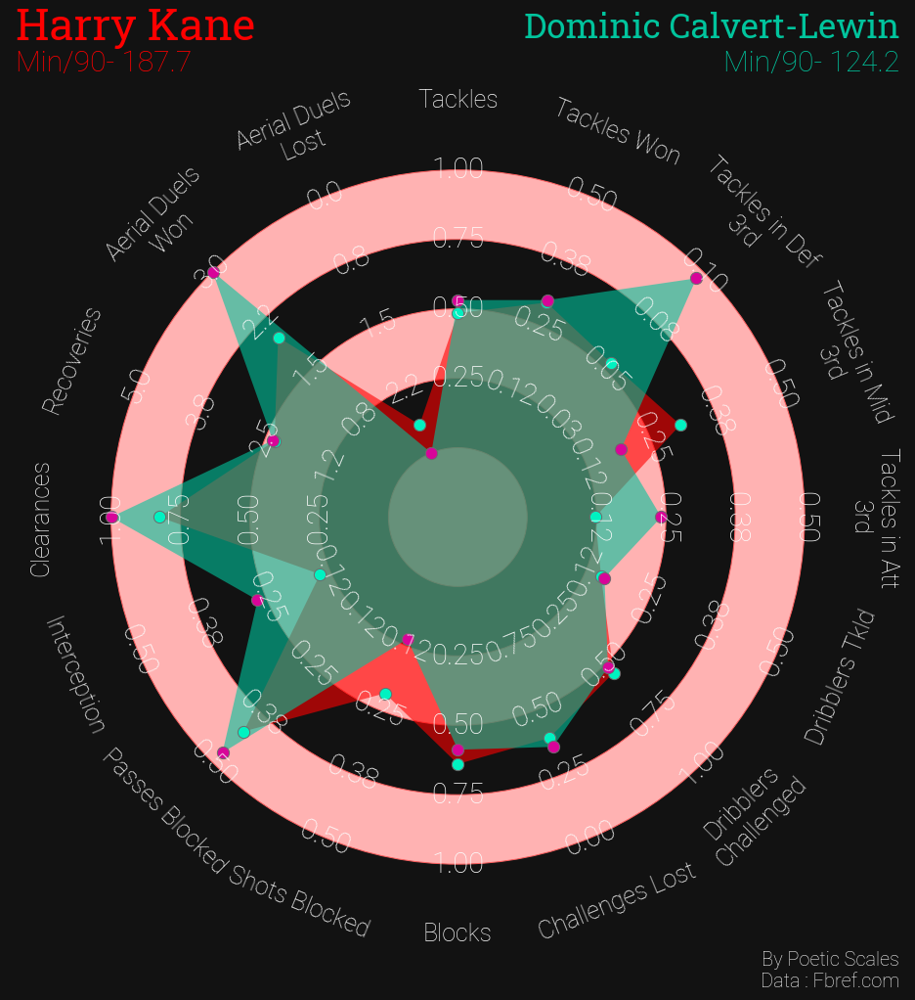

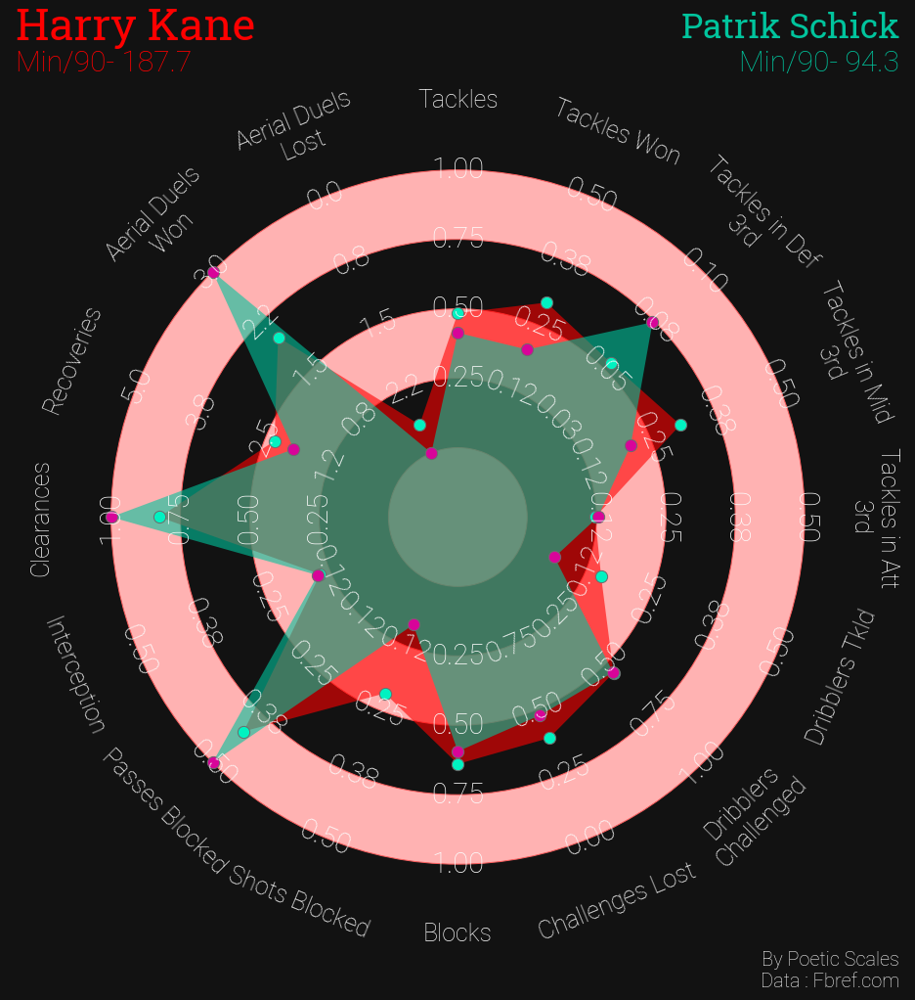

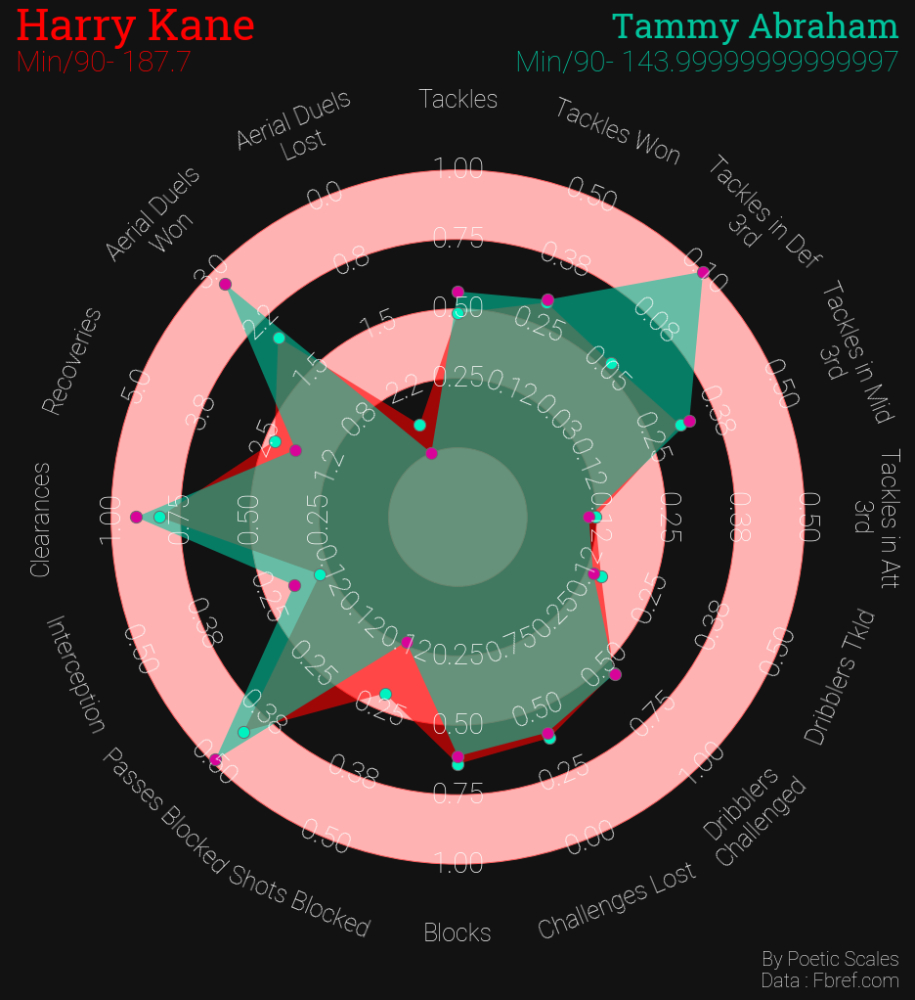

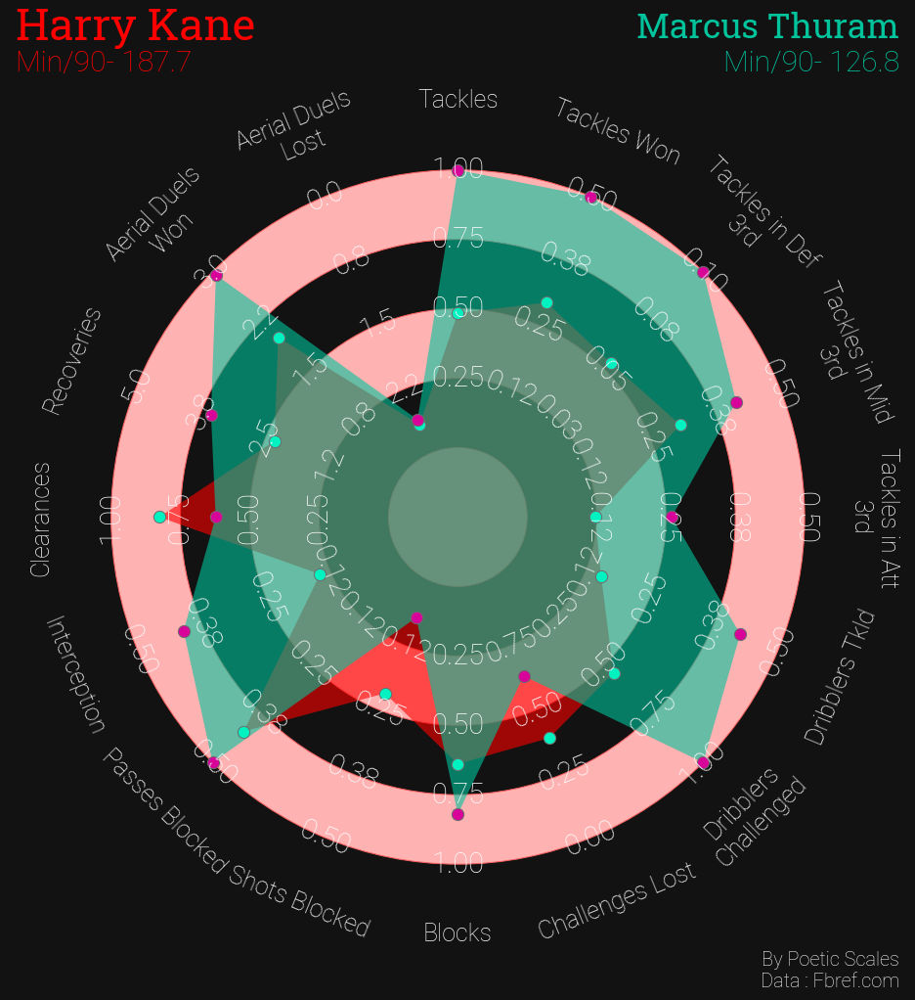

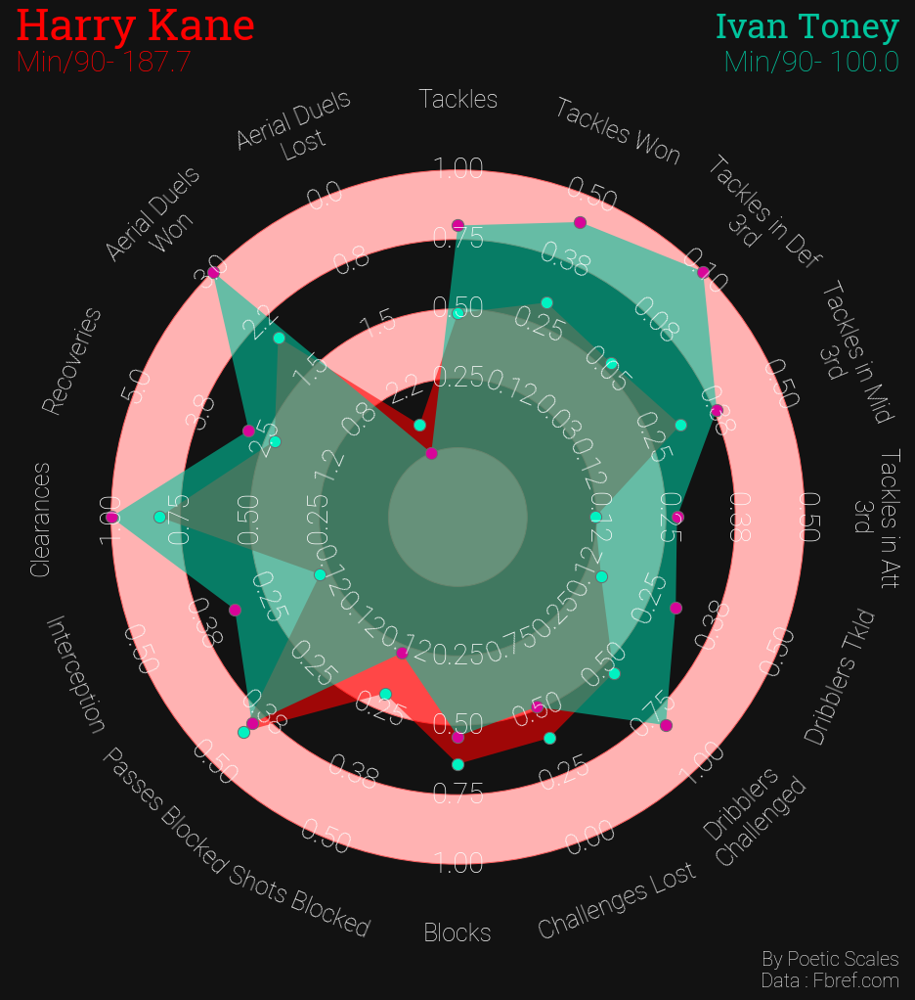

In [24]:
for i in all_players:
    comp_radar_chart(similar_player=i)

In [26]:
os.chdir(final_dir)

# With the ball stats data preparations

In [27]:
df2 = pd.read_csv('gca_stats.csv')
df2.head()

,Unnamed: 0.2,Unnamed: 0.1,Unnamed: 0,Player,Span,Nation,Pos,Squad,90s,SCA,SCA90,PassLive,PassDead,TO,Sh,Fld,Def,GCA,GCA90,PassLive.1,PassDead.1,TO.1,Sh.1,Fld.1,Def.1
0,0,0.0,0,Harry Kane,Career,eng ENG,FW,Tottenham,187.7,626.0,19.80,405.0,9.0,78.0,76.0,50.0,8.0,94.0,2.95,62.0,1.0,12.0,11.0,8.0,0.0
1,1,1.0,0,Dušan Vlahović,Career,rs SRB,FW,3 squads,104.5,219.0,2.20,133.0,1.0,20.0,38.0,27.0,0.0,28.0,0.28,13.0,0.0,1.0,9.0,5.0,0.0
2,2,2.0,1,Randal Kolo Muani,Career,fr FRA,FW,2 squads,89.5,253.0,2.83,149.0,0.0,43.0,18.0,41.0,2.0,50.0,0.56,26.0,0.0,11.0,5.0,8.0,0.0
3,3,3.0,2,Loïs Openda,Career,be BEL,FW,3 squads,85.0,230.0,3.07,137.0,1.0,29.0,25.0,37.0,1.0,18.0,0.24,9.0,0.0,6.0,2.0,1.0,0.0
4,4,4.0,3,Giacomo Raspadori,Career,it ITA,DF,2 squads,54.0,200.0,3.70,138.0,19.0,16.0,9.0,17.0,1.0,24.0,0.44,13.0,2.0,5.0,0.0,4.0,0.0


In [28]:
df2.rename(columns={'TO':'SCA TO','TO.1':'GCA TO'}, inplace=True)

In [29]:
final_df = pd.DataFrame()
final_df = df2[['Player','Nation','Pos','90s','SCA','GCA','SCA TO','GCA TO']]
final_df

,Player,Nation,Pos,90s,SCA,GCA,SCA TO,GCA TO
0,Harry Kane,eng ENG,FW,187.7,626.0,94.0,78.0,12.0
1,Dušan Vlahović,rs SRB,FW,104.5,219.0,28.0,20.0,1.0
2,Randal Kolo Muani,fr FRA,FW,89.5,253.0,50.0,43.0,11.0
3,Loïs Openda,be BEL,FW,85.0,230.0,18.0,29.0,6.0
4,Giacomo Raspadori,it ITA,DF,54.0,200.0,24.0,16.0,5.0
5,Josip Brekalo,hr CRO,"FW,MF",112.1,444.0,42.0,29.0,6.0
6,Moise Kean,it ITA,FW,68.5,121.0,8.0,21.0,2.0
7,Jonathan David,ca CAN,FW,82.8,231.0,28.0,11.0,1.0
8,Dominic Calvert-Lewin,eng ENG,FW,124.2,234.0,31.0,17.0,2.0
9,Patrik Schick,cz CZE,"FW,MF",94.3,226.0,31.0,21.0,6.0


In [30]:
df4 = pd.read_csv('passing_stats.csv')
df4.head()

,Unnamed: 0.2,Unnamed: 0.1,Unnamed: 0,Player,Span,Nation,Pos,Squad,90s,Cmp,Att,Cmp%,TotDist,PrgDist,Cmp.1,Att.1,Cmp%.1,Cmp.2,Att.2,Cmp%.2,Cmp.3,Att.3,Cmp%.3,Ast,xAG,xA,A-xAG,KP,Passes in final 3rd,PPA,CrsPA,PrgP
0,0,0.0,0,Harry Kane,Career,eng ENG,FW,Tottenham,187.7,3026,4430,410.7,52398,16063,1494,1962,458.2,930,1294,431.1,417,671,368.9,33,30.7,18.3,2.3,230,421,174,22,658
1,1,1.0,0,Dušan Vlahović,Career,rs SRB,FW,3 squads,104.5,1269,1910,66.4,19386,3163,685,920,74.5,412,591,69.7,99,148,66.9,9,7.6,5.4,1.4,77,81,47,7,148
2,2,2.0,1,Randal Kolo Muani,Career,fr FRA,FW,2 squads,89.5,1085,1665,65.2,13595,2617,688,942,73.0,272,418,65.1,35,66,53.0,18,15.6,11.6,2.4,105,56,40,10,113
3,3,3.0,2,Loïs Openda,Career,be BEL,FW,3 squads,85.0,1072,1629,65.8,15091,3096,608,841,72.3,321,448,71.7,54,123,43.9,8,10.1,8.5,-2.1,79,62,62,17,114
4,4,4.0,3,Giacomo Raspadori,Career,it ITA,DF,2 squads,54.0,1410,1821,77.4,21551,3947,761,874,87.1,441,531,83.1,107,215,49.8,4,6.6,6.0,-2.6,83,71,48,2,148


In [31]:
#df4.rename(columns={'1/3':'Passes in final 3rd'},inplace=True)

In [32]:
final_df['PrgDist of Passes'] = df4['PrgDist']
final_df['Ast'] =df4['Ast'] 
final_df['xA'] = df4['xA']
final_df['KP'] =df4['KP']
final_df['Passes in final 3rd'] = df4['Passes in final 3rd']
final_df['PPA'] = df4['PPA']
final_df['CrsPA'] = df4['CrsPA']
final_df['PrgP'] = df4['PrgP']

In [33]:
final_df

,Player,Nation,Pos,90s,SCA,GCA,SCA TO,GCA TO,PrgDist of Passes,Ast,xA,KP,Passes in final 3rd,PPA,CrsPA,PrgP
0,Harry Kane,eng ENG,FW,187.7,626.0,94.0,78.0,12.0,16063,33,18.3,230,421,174,22,658
1,Dušan Vlahović,rs SRB,FW,104.5,219.0,28.0,20.0,1.0,3163,9,5.4,77,81,47,7,148
2,Randal Kolo Muani,fr FRA,FW,89.5,253.0,50.0,43.0,11.0,2617,18,11.6,105,56,40,10,113
3,Loïs Openda,be BEL,FW,85.0,230.0,18.0,29.0,6.0,3096,8,8.5,79,62,62,17,114
4,Giacomo Raspadori,it ITA,DF,54.0,200.0,24.0,16.0,5.0,3947,4,6.0,83,71,48,2,148
5,Josip Brekalo,hr CRO,"FW,MF",112.1,444.0,42.0,29.0,6.0,13826,18,17.9,210,256,146,36,427
6,Moise Kean,it ITA,FW,68.5,121.0,8.0,21.0,2.0,1759,4,2.6,44,40,23,5,72
7,Jonathan David,ca CAN,FW,82.8,231.0,28.0,11.0,1.0,3936,6,8.0,106,115,57,5,171
8,Dominic Calvert-Lewin,eng ENG,FW,124.2,234.0,31.0,17.0,2.0,4343,11,6.7,79,121,50,11,179
9,Patrik Schick,cz CZE,"FW,MF",94.3,226.0,31.0,21.0,6.0,3013,7,6.3,105,71,31,2,117


In [34]:
df5  =pd.read_csv('passing_types_stats.csv')
df5.head()

,Unnamed: 0.2,Unnamed: 0.1,Unnamed: 0,Player,Span,Nation,Pos,Squad,90s,Att,Live,Dead,FK,TB,Sw,Crs,TI,CK,In,Out,Str,Cmp,Off,Blocks
0,0,0.0,0,Harry Kane,Career,eng ENG,FW,Tottenham,187.7,4430.0,4192.0,201.0,49.0,74.0,95.0,161.0,80.0,1.0,0.0,0.0,0.0,3026.0,37.0,167.0
1,1,1.0,0,Dušan Vlahović,Career,rs SRB,FW,3 squads,104.5,1910.0,1773.0,130.0,5.0,9.0,22.0,66.0,2.0,1.0,0.0,0.0,0.0,1269.0,7.0,99.0
2,2,2.0,1,Randal Kolo Muani,Career,fr FRA,FW,2 squads,89.5,1665.0,1592.0,64.0,0.0,5.0,4.0,68.0,7.0,0.0,0.0,0.0,0.0,1085.0,9.0,72.0
3,3,3.0,2,Loïs Openda,Career,be BEL,FW,3 squads,85.0,1629.0,1472.0,150.0,5.0,9.0,12.0,109.0,61.0,1.0,0.0,0.0,0.0,1072.0,7.0,60.0
4,4,4.0,3,Giacomo Raspadori,Career,it ITA,DF,2 squads,54.0,1821.0,1634.0,180.0,38.0,12.0,22.0,123.0,6.0,82.0,42.0,26.0,0.0,1410.0,7.0,55.0


In [35]:
final_df['Passes_offside'] = df5['Off']
final_df['Passes_Blocked'] =df5['Blocks'] 

In [36]:
df6 = pd.read_csv('possession_stats.csv')
df6.head()

,Unnamed: 0.2,Unnamed: 0.1,Unnamed: 0,Player,Span,Nation,Pos,Squad,90s,Touches,Def Pen,Def 3rd,Mid 3rd,Att 3rd,Att Pen,Live,Att,Succ,Succ%,Tkld,Tkld%,Carries,TotDist,PrgDist,PrgC,Carries in final 3rd,CPA,Mis,Dis,Rec,PrgR
0,0,0.0,0,Harry Kane,Career,eng ENG,FW,Tottenham,187.7,6643,202,481,3010,3237,933,6622,513,253,294.7,250,293.1,4237,23918,9921,371,245,158,427,302,5235,1182
1,1,1.0,0,Dušan Vlahović,Career,rs SRB,FW,3 squads,104.5,3139,66,188,1366,1629,518,3123,187,96,51.3,90,48.1,1878,9148,3442,132,97,58,370,240,2539,710
2,2,2.0,1,Randal Kolo Muani,Career,fr FRA,FW,2 squads,89.5,2817,83,216,1179,1479,459,2816,352,166,47.2,166,47.2,1747,12358,6217,248,150,148,321,195,2114,604
3,3,3.0,2,Loïs Openda,Career,be BEL,FW,3 squads,85.0,2488,7,117,853,1565,479,2485,185,74,40.0,106,57.3,1540,10364,4328,185,106,118,221,97,1816,670
4,4,4.0,3,Giacomo Raspadori,Career,it ITA,DF,2 squads,54.0,2397,45,275,1027,1118,223,2397,113,60,53.1,51,45.1,1447,7105,2554,85,54,37,155,85,1782,346


In [37]:
#df6.rename(columns={'1/3':'Carries in final 3rd'},inplace=True)

In [38]:
final_df['Carries'] = df6['Carries']
final_df['PrgDist of Carries'] = df6['PrgDist']
final_df['Prog Carries'] = df6['PrgC']
final_df['Carries in 1/3'] = df6['Carries in final 3rd']
final_df['CPA'] = df6['CPA']
final_df['Miscontrols'] = df6['Mis']
final_df['Dispossessed'] = df6['Dis']
final_df['Prog Passes Rec'] = df6['PrgR']

In [39]:
df7 = pd.read_csv('shooting_stats.csv')
df7.head()

,Unnamed: 0.2,Unnamed: 0.1,Unnamed: 0,Player,Span,Nation,Pos,Squad,90s,Gls,Sh,SoT,SoT%,Sh/90,SoT/90,G/Sh,G/SoT,Dist,FK,PK,PKatt,xG,npxG,npxG/Sh,G-xG,np:G-xG
0,0,0.0,0,Harry Kane,Career,eng ENG,FW,Tottenham,187.7,126.0,716.0,285.0,242.0,22.61,9.06,0.91,2.28,104.4,47.0,19.0,21.0,106.0,89.4,0.76,20.0,17.6
1,1,1.0,0,Dušan Vlahović,Career,rs SRB,FW,3 squads,104.5,60.0,318.0,117.0,36.2,3.14,1.12,0.14,0.39,15.6,17.0,14.0,16.0,52.9,40.3,0.13,6.1,4.7
2,2,2.0,1,Randal Kolo Muani,Career,fr FRA,FW,2 squads,89.5,32.0,167.0,73.0,43.7,1.87,0.82,0.19,0.42,12.8,0.0,1.0,1.0,29.6,28.8,0.17,2.4,2.2
3,3,3.0,2,Loïs Openda,Career,be BEL,FW,3 squads,85.0,46.0,235.0,104.0,44.3,3.13,1.39,0.17,0.38,14.4,0.0,2.0,3.0,39.1,37.4,0.16,2.9,2.6
4,4,4.0,3,Giacomo Raspadori,Career,it ITA,DF,2 squads,54.0,19.0,132.0,54.0,40.9,2.44,1.00,0.14,0.35,16.7,7.0,0.0,0.0,15.3,15.3,0.12,3.7,3.7


In [40]:
final_df['Goals'] = df7['Gls']
final_df['xG'] = df7['xG']
final_df['npxG'] = df7['npxG']
final_df['Shots'] = df7['Sh']
final_df['SOT'] = df7['SoT']

In [41]:
final_df.head()

,Player,Nation,Pos,90s,SCA,GCA,SCA TO,GCA TO,PrgDist of Passes,Ast,xA,KP,Passes in final 3rd,PPA,CrsPA,PrgP,Passes_offside,Passes_Blocked,Carries,PrgDist of Carries,Prog Carries,Carries in 1/3,CPA,Miscontrols,Dispossessed,Prog Passes Rec,Goals,xG,npxG,Shots,SOT
0,Harry Kane,eng ENG,FW,187.7,626.0,94.0,78.0,12.0,16063,33,18.3,230,421,174,22,658,37.0,167.0,4237,9921,371,245,158,427,302,1182,126.0,106.0,89.4,716.0,285.0
1,Dušan Vlahović,rs SRB,FW,104.5,219.0,28.0,20.0,1.0,3163,9,5.4,77,81,47,7,148,7.0,99.0,1878,3442,132,97,58,370,240,710,60.0,52.9,40.3,318.0,117.0
2,Randal Kolo Muani,fr FRA,FW,89.5,253.0,50.0,43.0,11.0,2617,18,11.6,105,56,40,10,113,9.0,72.0,1747,6217,248,150,148,321,195,604,32.0,29.6,28.8,167.0,73.0
3,Loïs Openda,be BEL,FW,85.0,230.0,18.0,29.0,6.0,3096,8,8.5,79,62,62,17,114,7.0,60.0,1540,4328,185,106,118,221,97,670,46.0,39.1,37.4,235.0,104.0
4,Giacomo Raspadori,it ITA,DF,54.0,200.0,24.0,16.0,5.0,3947,4,6.0,83,71,48,2,148,7.0,55.0,1447,2554,85,54,37,155,85,346,19.0,15.3,15.3,132.0,54.0


In [42]:
details_df = final_df.iloc[:,0:4]
details_df

,Player,Nation,Pos,90s
0,Harry Kane,eng ENG,FW,187.7
1,Dušan Vlahović,rs SRB,FW,104.5
2,Randal Kolo Muani,fr FRA,FW,89.5
3,Loïs Openda,be BEL,FW,85.0
4,Giacomo Raspadori,it ITA,DF,54.0
5,Josip Brekalo,hr CRO,"FW,MF",112.1
6,Moise Kean,it ITA,FW,68.5
7,Jonathan David,ca CAN,FW,82.8
8,Dominic Calvert-Lewin,eng ENG,FW,124.2
9,Patrik Schick,cz CZE,"FW,MF",94.3


In [43]:
pass_carry_df = final_df.iloc[:,8:-6]

In [44]:
final_pass_carry_df = pd.concat([details_df,pass_carry_df],axis=1)
final_pass_carry_df

,Player,Nation,Pos,90s,PrgDist of Passes,Ast,xA,KP,Passes in final 3rd,PPA,CrsPA,PrgP,Passes_offside,Passes_Blocked,Carries,PrgDist of Carries,Prog Carries,Carries in 1/3,CPA,Miscontrols,Dispossessed
0,Harry Kane,eng ENG,FW,187.7,16063,33,18.3,230,421,174,22,658,37.0,167.0,4237,9921,371,245,158,427,302
1,Dušan Vlahović,rs SRB,FW,104.5,3163,9,5.4,77,81,47,7,148,7.0,99.0,1878,3442,132,97,58,370,240
2,Randal Kolo Muani,fr FRA,FW,89.5,2617,18,11.6,105,56,40,10,113,9.0,72.0,1747,6217,248,150,148,321,195
3,Loïs Openda,be BEL,FW,85.0,3096,8,8.5,79,62,62,17,114,7.0,60.0,1540,4328,185,106,118,221,97
4,Giacomo Raspadori,it ITA,DF,54.0,3947,4,6.0,83,71,48,2,148,7.0,55.0,1447,2554,85,54,37,155,85
5,Josip Brekalo,hr CRO,"FW,MF",112.1,13826,18,17.9,210,256,146,36,427,25.0,162.0,3438,10563,372,258,110,227,183
6,Moise Kean,it ITA,FW,68.5,1759,4,2.6,44,40,23,5,72,6.0,46.0,1225,3519,145,81,67,196,135
7,Jonathan David,ca CAN,FW,82.8,3936,6,8.0,106,115,57,5,171,17.0,57.0,1801,3987,137,94,87,250,117
8,Dominic Calvert-Lewin,eng ENG,FW,124.2,4343,11,6.7,79,121,50,11,179,15.0,88.0,2164,4073,170,114,69,411,158
9,Patrik Schick,cz CZE,"FW,MF",94.3,3013,7,6.3,105,71,31,2,117,12.0,40.0,1618,2550,94,54,59,286,108


In [45]:
goals_shots_df = final_df.iloc[:,0:8]
goals_shots_df

,Player,Nation,Pos,90s,SCA,GCA,SCA TO,GCA TO
0,Harry Kane,eng ENG,FW,187.7,626.0,94.0,78.0,12.0
1,Dušan Vlahović,rs SRB,FW,104.5,219.0,28.0,20.0,1.0
2,Randal Kolo Muani,fr FRA,FW,89.5,253.0,50.0,43.0,11.0
3,Loïs Openda,be BEL,FW,85.0,230.0,18.0,29.0,6.0
4,Giacomo Raspadori,it ITA,DF,54.0,200.0,24.0,16.0,5.0
5,Josip Brekalo,hr CRO,"FW,MF",112.1,444.0,42.0,29.0,6.0
6,Moise Kean,it ITA,FW,68.5,121.0,8.0,21.0,2.0
7,Jonathan David,ca CAN,FW,82.8,231.0,28.0,11.0,1.0
8,Dominic Calvert-Lewin,eng ENG,FW,124.2,234.0,31.0,17.0,2.0
9,Patrik Schick,cz CZE,"FW,MF",94.3,226.0,31.0,21.0,6.0


In [46]:
random_df = final_df.iloc[:,-6:]
random_df

,Prog Passes Rec,Goals,xG,npxG,Shots,SOT
0,1182,126.0,106.0,89.4,716.0,285.0
1,710,60.0,52.9,40.3,318.0,117.0
2,604,32.0,29.6,28.8,167.0,73.0
3,670,46.0,39.1,37.4,235.0,104.0
4,346,19.0,15.3,15.3,132.0,54.0
5,759,25.0,16.9,16.8,200.0,88.0
6,408,36.0,33.1,33.1,200.0,80.0
7,566,47.0,41.8,34.0,198.0,99.0
8,657,45.0,51.4,49.0,309.0,131.0
9,649,51.0,47.6,46.0,292.0,121.0


In [47]:
goals_shots_df = pd.concat([goals_shots_df,random_df],axis=1)
goals_shots_df

,Player,Nation,Pos,90s,SCA,GCA,SCA TO,GCA TO,Prog Passes Rec,Goals,xG,npxG,Shots,SOT
0,Harry Kane,eng ENG,FW,187.7,626.0,94.0,78.0,12.0,1182,126.0,106.0,89.4,716.0,285.0
1,Dušan Vlahović,rs SRB,FW,104.5,219.0,28.0,20.0,1.0,710,60.0,52.9,40.3,318.0,117.0
2,Randal Kolo Muani,fr FRA,FW,89.5,253.0,50.0,43.0,11.0,604,32.0,29.6,28.8,167.0,73.0
3,Loïs Openda,be BEL,FW,85.0,230.0,18.0,29.0,6.0,670,46.0,39.1,37.4,235.0,104.0
4,Giacomo Raspadori,it ITA,DF,54.0,200.0,24.0,16.0,5.0,346,19.0,15.3,15.3,132.0,54.0
5,Josip Brekalo,hr CRO,"FW,MF",112.1,444.0,42.0,29.0,6.0,759,25.0,16.9,16.8,200.0,88.0
6,Moise Kean,it ITA,FW,68.5,121.0,8.0,21.0,2.0,408,36.0,33.1,33.1,200.0,80.0
7,Jonathan David,ca CAN,FW,82.8,231.0,28.0,11.0,1.0,566,47.0,41.8,34.0,198.0,99.0
8,Dominic Calvert-Lewin,eng ENG,FW,124.2,234.0,31.0,17.0,2.0,657,45.0,51.4,49.0,309.0,131.0
9,Patrik Schick,cz CZE,"FW,MF",94.3,226.0,31.0,21.0,6.0,649,51.0,47.6,46.0,292.0,121.0


# Goals and shots radar

In [48]:
goals_shots_df.head(2)

,Player,Nation,Pos,90s,SCA,GCA,SCA TO,GCA TO,Prog Passes Rec,Goals,xG,npxG,Shots,SOT
0,Harry Kane,eng ENG,FW,187.7,626.0,94.0,78.0,12.0,1182,126.0,106.0,89.4,716.0,285.0
1,Dušan Vlahović,rs SRB,FW,104.5,219.0,28.0,20.0,1.0,710,60.0,52.9,40.3,318.0,117.0


In [49]:
player1_df = goals_shots_df.iloc[0:1,3:]
player1_df = player1_df.div(player1_df['90s'],axis=0)
player1_df_value = player1_df.iloc[:,1:].values.tolist()
player1_df_value =player1_df_value[0]

In [50]:
player1_df

,90s,SCA,GCA,SCA TO,GCA TO,Prog Passes Rec,Goals,xG,npxG,Shots,SOT
0,1.0,3.335109,0.500799,0.415557,0.063932,6.297283,0.671284,0.564731,0.476292,3.814598,1.51838


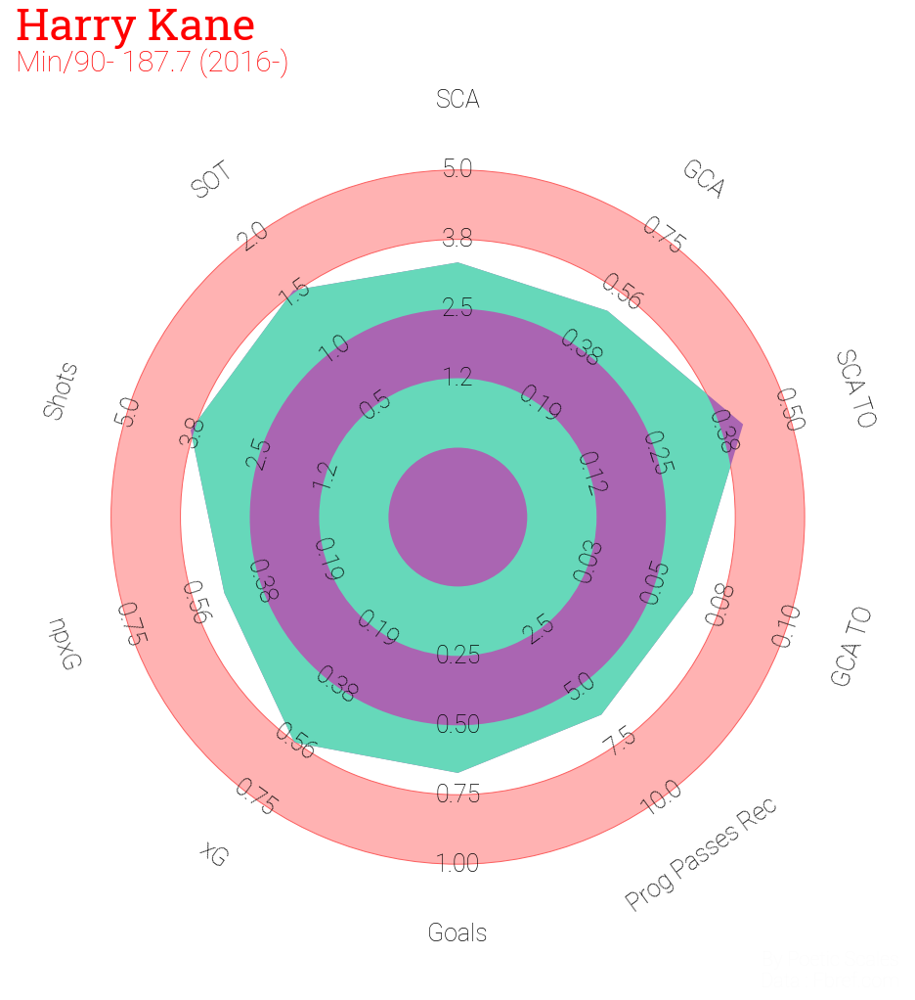

In [54]:

params = ['SCA','GCA','SCA TO','GCA TO','Prog Passes Rec','Goals','xG','npxG','Shots','SOT']

low = [0,0,0,0,0,0,0,0,0,0]
high =[5,0.75,0.5,0.1,10,1,0.75,0.75,5,2]



radar = Radar(params, low, high,
          # whether to round any of the labels to integers instead of decimal places
          round_int=[False]*len(params),
          num_rings=4,  # the number of concentric circles (excluding center circle)
          # if the ring_width is more than the center_circle_radius then
          # the center circle radius will be wider than the width of the concentric circles
          ring_width=1, center_circle_radius=1)

fig, axs = grid(figheight=14, grid_height=0.915, title_height=0.06, endnote_height=0.025,
                title_space=0, endnote_space=0, grid_key='radar', axis=False)

# plot the radar
radar.setup_axis(ax=axs['radar'])
rings_inner = radar.draw_circles(ax=axs['radar'], facecolor='#ffb2b2', edgecolor='#fc5f5f')
radar_output = radar.draw_radar(player1_df_value, ax=axs['radar'],
                                kwargs_radar={'facecolor': '#aa65b2'},
                                kwargs_rings={'facecolor': '#66d8ba'})
radar_poly, rings_outer, vertices = radar_output
range_labels = radar.draw_range_labels(ax=axs['radar'], fontsize=25,
                                       fontproperties=robotto_thin.prop)
param_labels = radar.draw_param_labels(ax=axs['radar'], fontsize=25,
                                       fontproperties=robotto_thin.prop)

# adding the endnote and title text (these axes range from 0-1, i.e. 0, 0 is the bottom left)
# Note we are slightly offsetting the text from the edges by 0.01 (1%, e.g. 0.99)
endnote_text = axs['endnote'].text(0.99, 0.9, "By Poetic Scales\nData : Fbref.com", fontsize=20,color='#fcfcfc',
                                       fontproperties=robotto_thin.prop, ha='right', va='center')
title1_text = axs['title'].text(0.01, 0.65, player, fontsize=45, color='red',
                                fontproperties=robotto_bold.prop, ha='left', va='center')

title2_text = axs['title'].text(0.01, 0.05, f"Min/90- {per_90s} (2016-)", fontsize=30,
                            fontproperties=robotto_thin.prop,
                            ha='left', va='center', color='red')
os.chdir(goals_shots_dir)
plt.savefig(f"{player}_goals_shots.png")


In [55]:
def comp_radar_chart(similar_player):
    player2_df = goals_shots_df.loc[df['Player']==similar_player]
    player2_90s = player2_df['90s']
    
    player2_df = player2_df.iloc[:,3:]
    player2_df = player2_df.div(player2_df['90s'],axis=0)
    player2_df_value = player2_df.iloc[:,1:].values.tolist()
    player2_df_value =player2_df_value[0]
    
    
    
    params = ['SCA','GCA','SCA TO','GCA TO','Prog Passes Rec','Goals','xG','npxG','Shots','SOT']

    low = [0,0,0,0,0,0,0,0,0,0]
    high =[5,0.75,0.5,0.1,10,1,0.75,0.75,5,2]

    

    radar = Radar(params, low, high,
              # whether to round any of the labels to integers instead of decimal places
              round_int=[False]*len(params),
              num_rings=4,  # the number of concentric circles (excluding center circle)
              # if the ring_width is more than the center_circle_radius then
              # the center circle radius will be wider than the width of the concentric circles
              ring_width=1, center_circle_radius=1)
    
    fig, axs = grid(figheight=14, grid_height=0.915, title_height=0.06, endnote_height=0.025,
                title_space=0, endnote_space=0, grid_key='radar', axis=False)

    # plot radar
    radar.setup_axis(ax=axs['radar'],facecolor='None')  # format axis as a radar
    rings_inner = radar.draw_circles(ax=axs['radar'], facecolor='#ffb2b2', edgecolor='#fc5f5f')
    radar_output = radar.draw_radar_compare(player1_df_value,player2_df_value, ax=axs['radar'],
                                            kwargs_radar={'facecolor': 'red', 'alpha': 0.6},
                                            kwargs_compare={'facecolor': '#01c49d', 'alpha': 0.6})
    radar_poly, radar_poly2, vertices1, vertices2 = radar_output
    range_labels = radar.draw_range_labels(ax=axs['radar'], fontsize=29,color='#fcfcfc',
                                           fontproperties=robotto_thin.prop)
    param_labels = radar.draw_param_labels(ax=axs['radar'], fontsize=25,color='#fcfcfc',
                                           fontproperties=robotto_thin.prop)
    axs['radar'].scatter(vertices1[:, 0], vertices1[:, 1],
                         c='#00f2c1', edgecolors='#6d6c6d', marker='o', s=150, zorder=2)
    axs['radar'].scatter(vertices2[:, 0], vertices2[:, 1],
                         c='#d80499', edgecolors='#6d6c6d', marker='o', s=150, zorder=2)

    # adding the endnote and title text (these axes range from 0-1, i.e. 0, 0 is the bottom left)
    # Note we are slightly offsetting the text from the edges by 0.01 (1%, e.g. 0.99)
    endnote_text = axs['endnote'].text(0.99, 0.9, "By Poetic Scales\nData : Fbref.com", fontsize=20,color='#fcfcfc',
                                       fontproperties=robotto_thin.prop, ha='right', va='center')
    title1_text = axs['title'].text(0.01, 0.65, player, fontsize=45, color='red',
                                    fontproperties=robotto_bold.prop, ha='left', va='center')
    
    title2_text = axs['title'].text(0.01, 0.05, f"Min/90- {per_90s} (2016-)", fontsize=30,
                                fontproperties=robotto_thin.prop,
                                ha='left', va='center', color='red')

    title3_text = axs['title'].text(0.99, 0.65, similar_player, fontsize=35,
                                    fontproperties=robotto_bold.prop,
                                    ha='right', va='center', color='#01c49d')
    title4_text = axs['title'].text(0.99, 0.05, f"Min/90- {float(player2_90s)}", fontsize=30,
                                fontproperties=robotto_thin.prop,
                                ha='right', va='center', color='#01c49d')
    fig.set_facecolor('#121212')
    plt.savefig(f"vs {similar_player}_goals_shots.png")

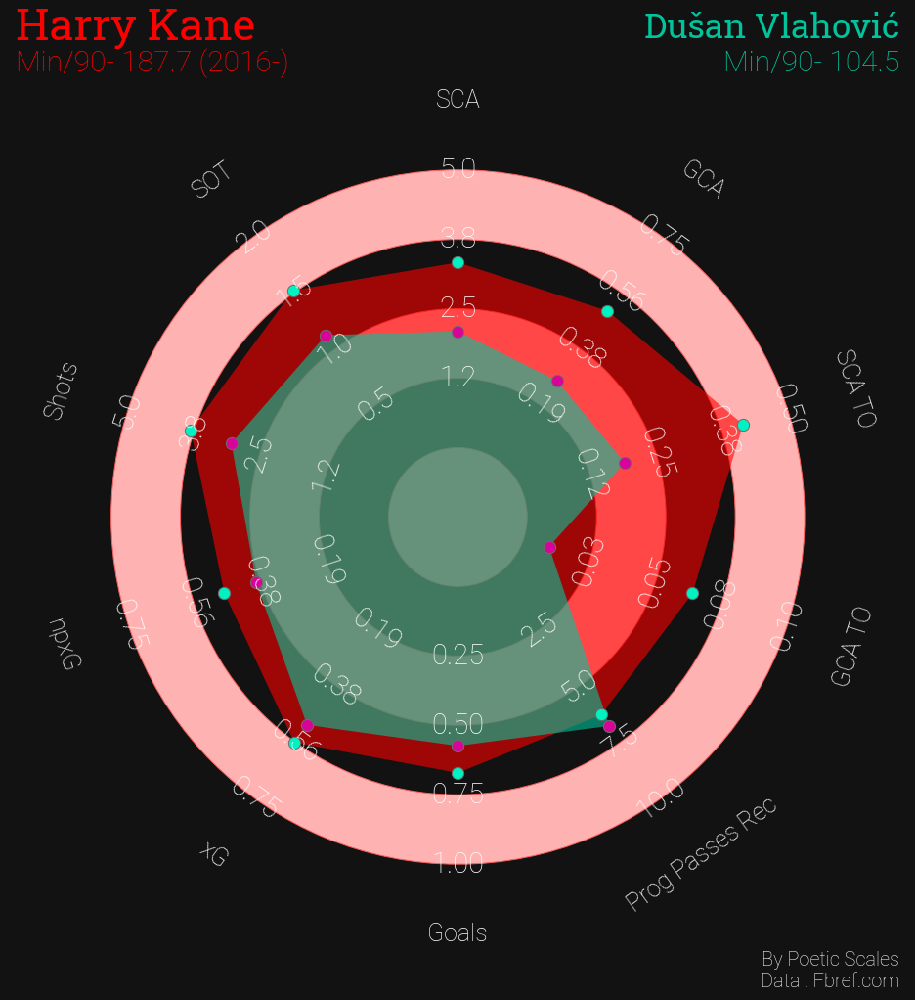

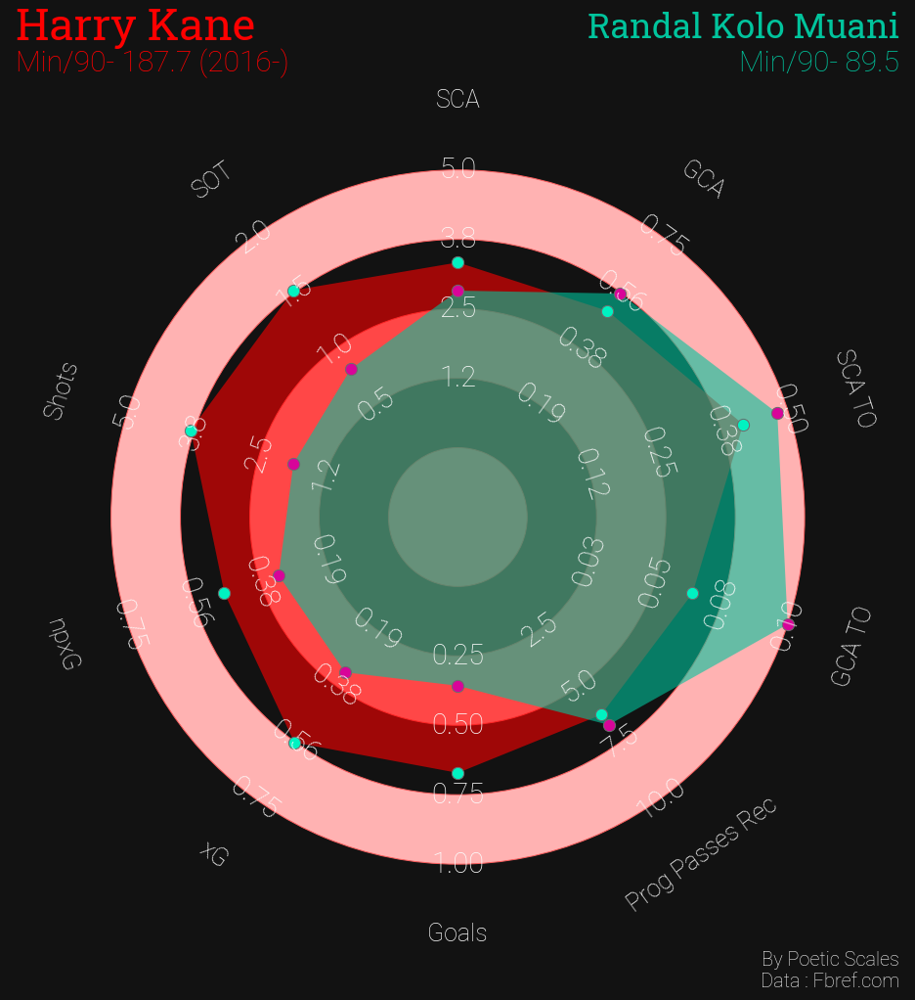

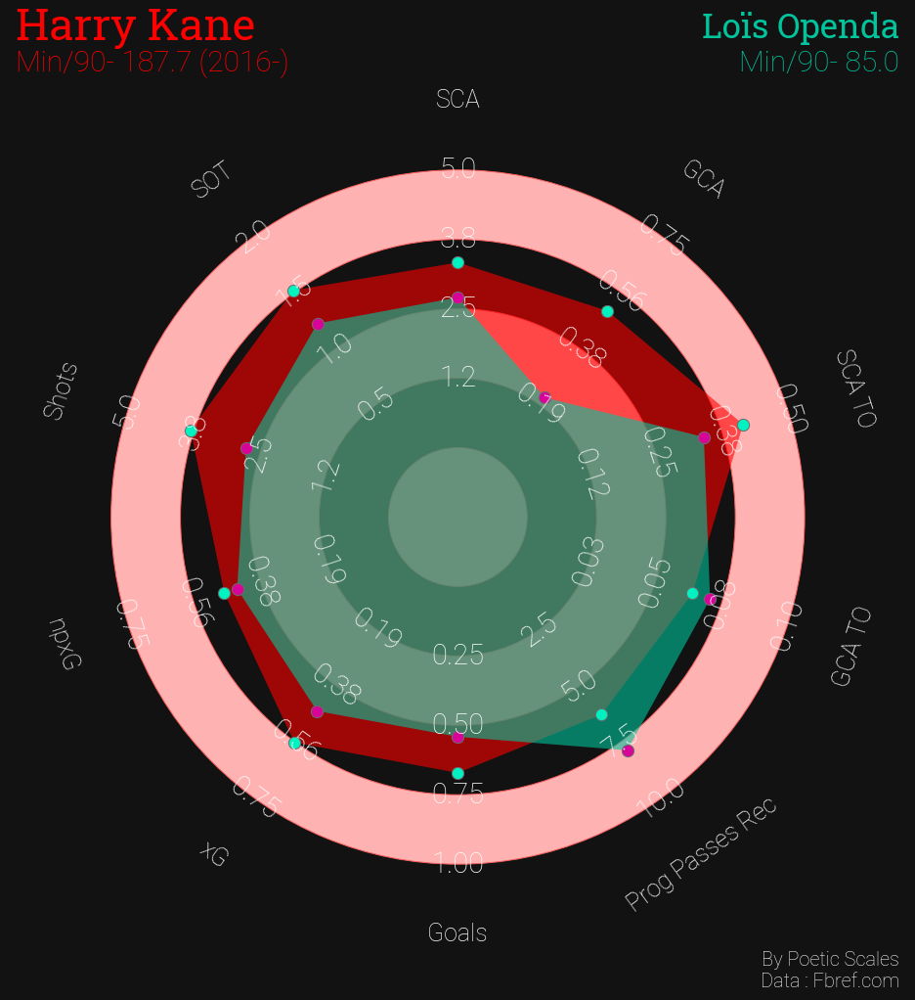

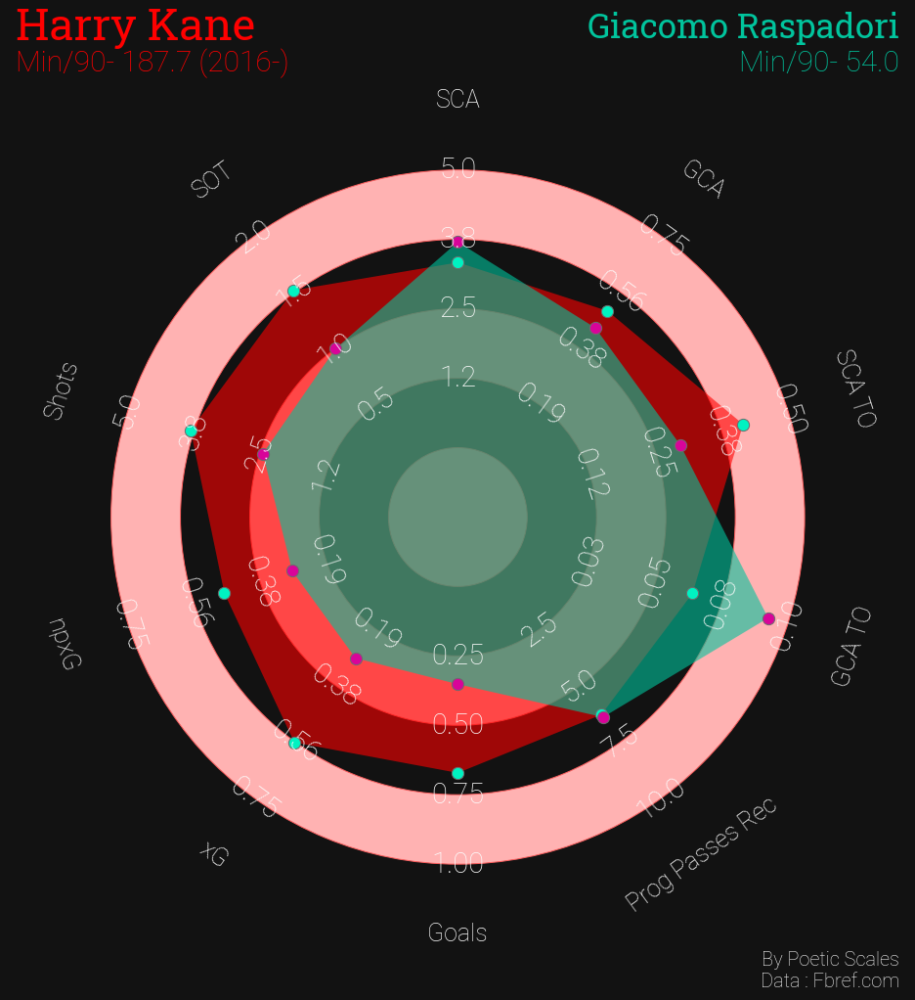

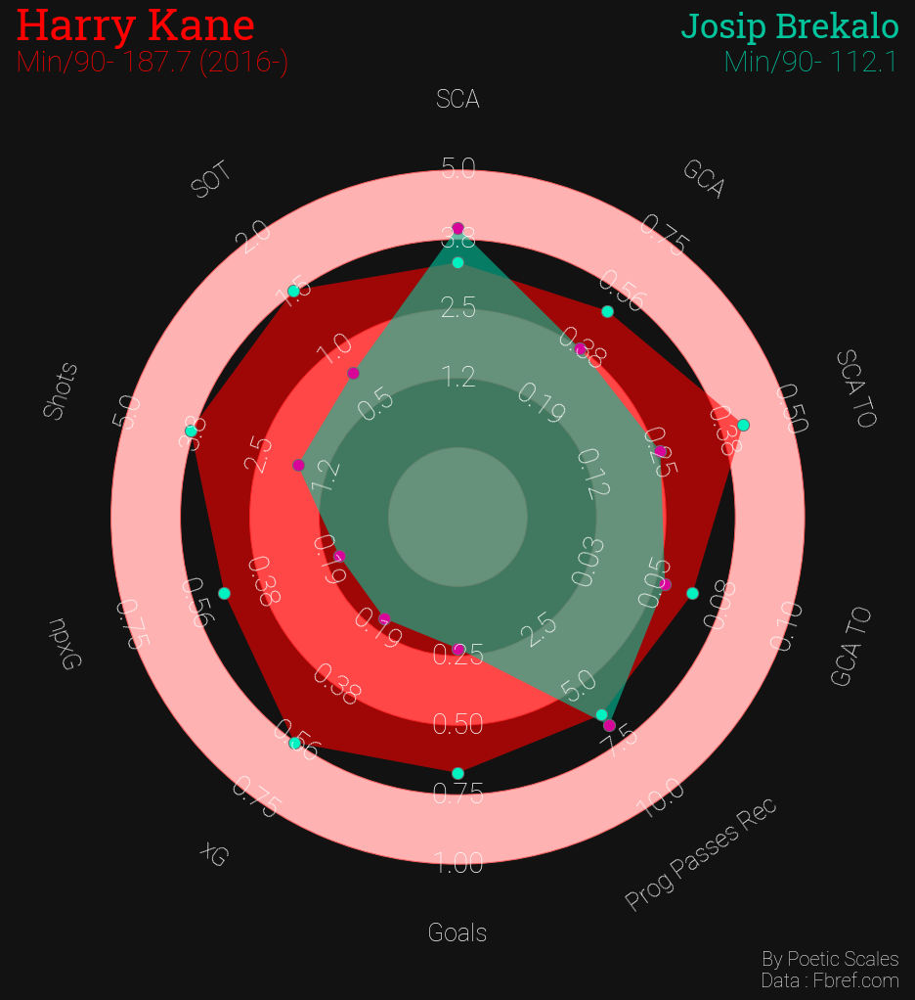

...

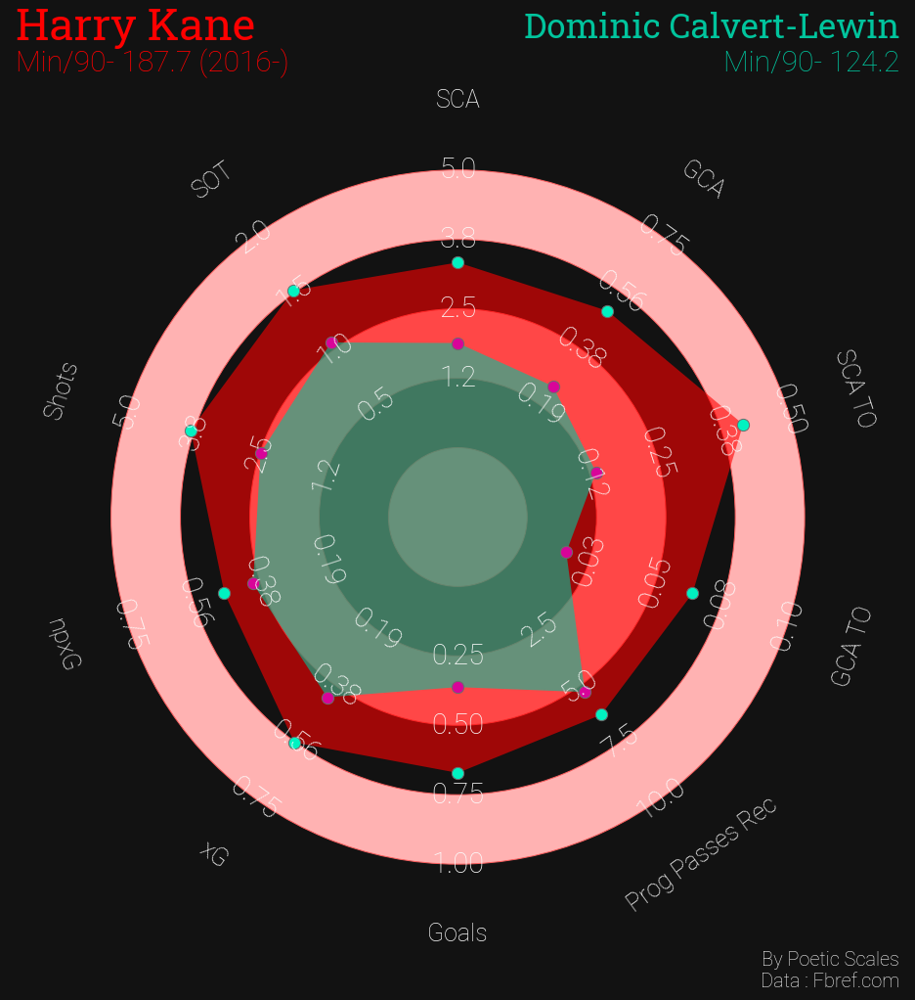

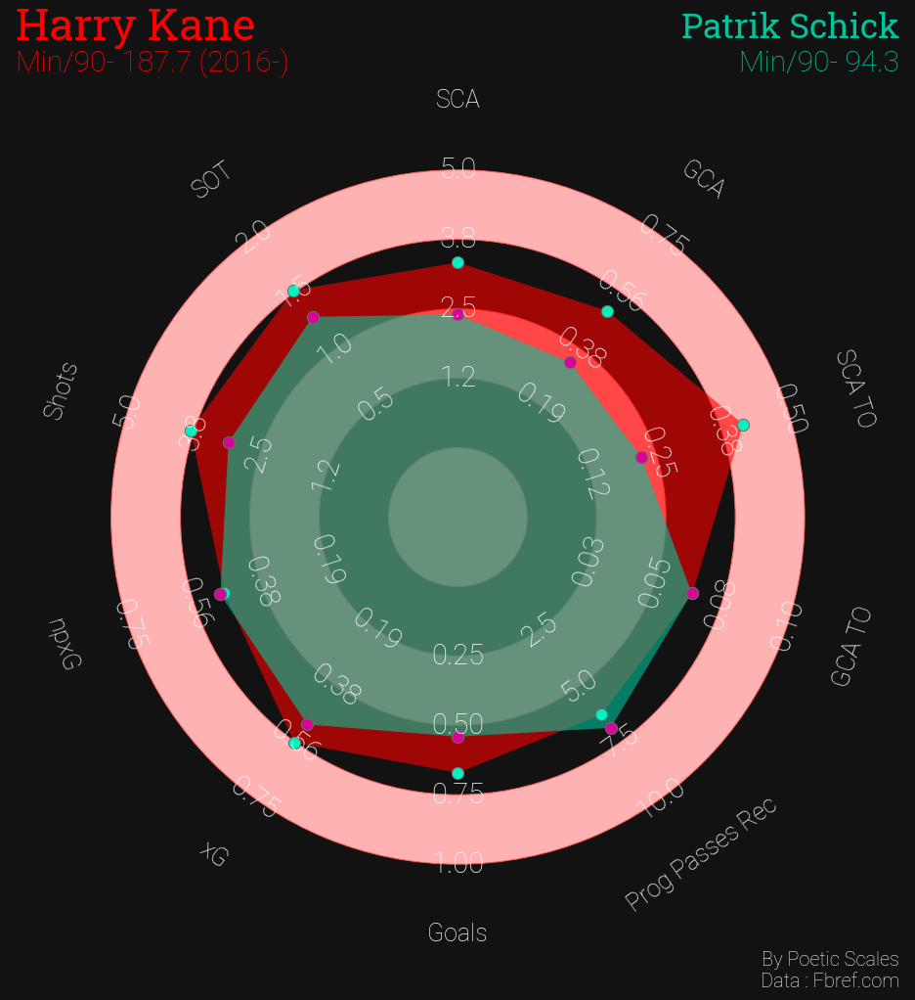

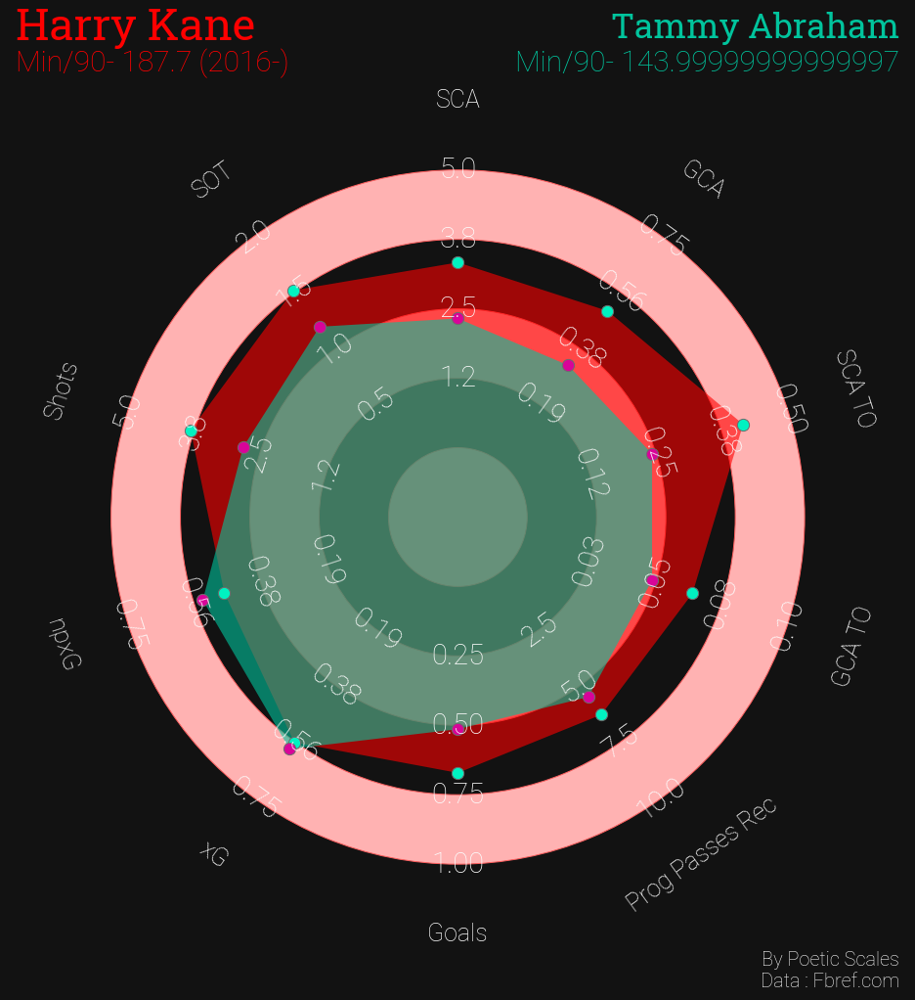

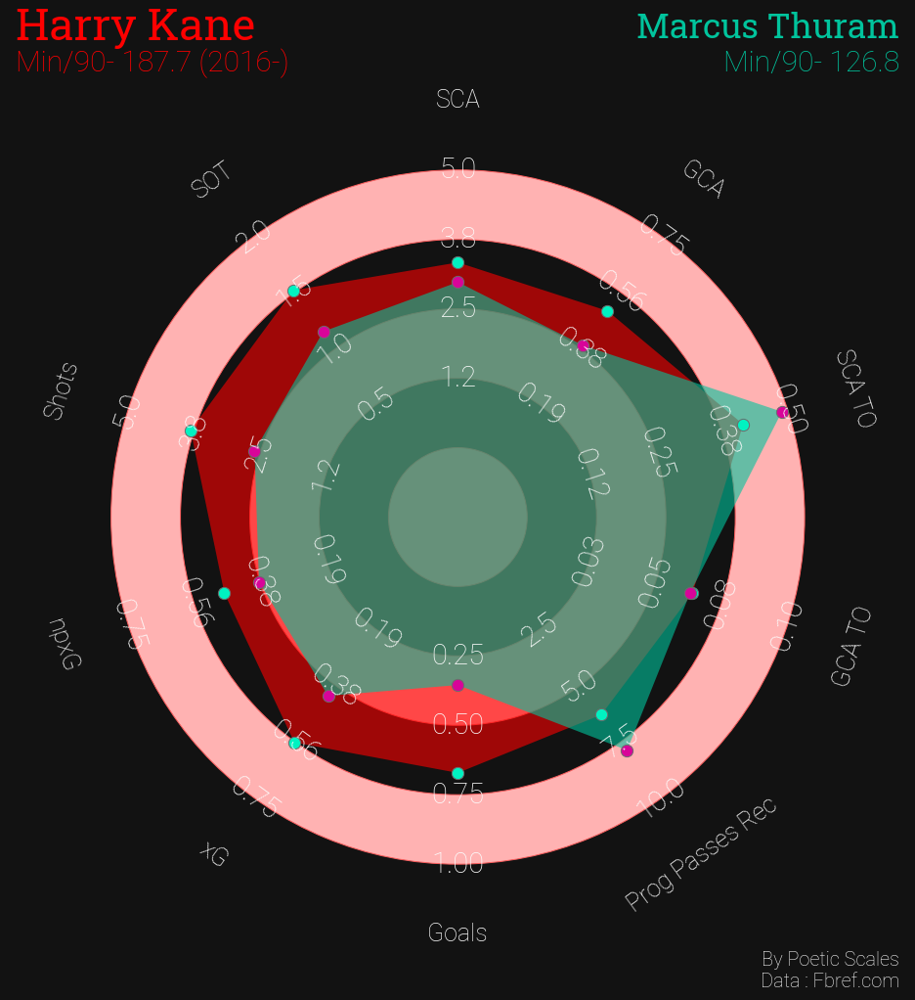

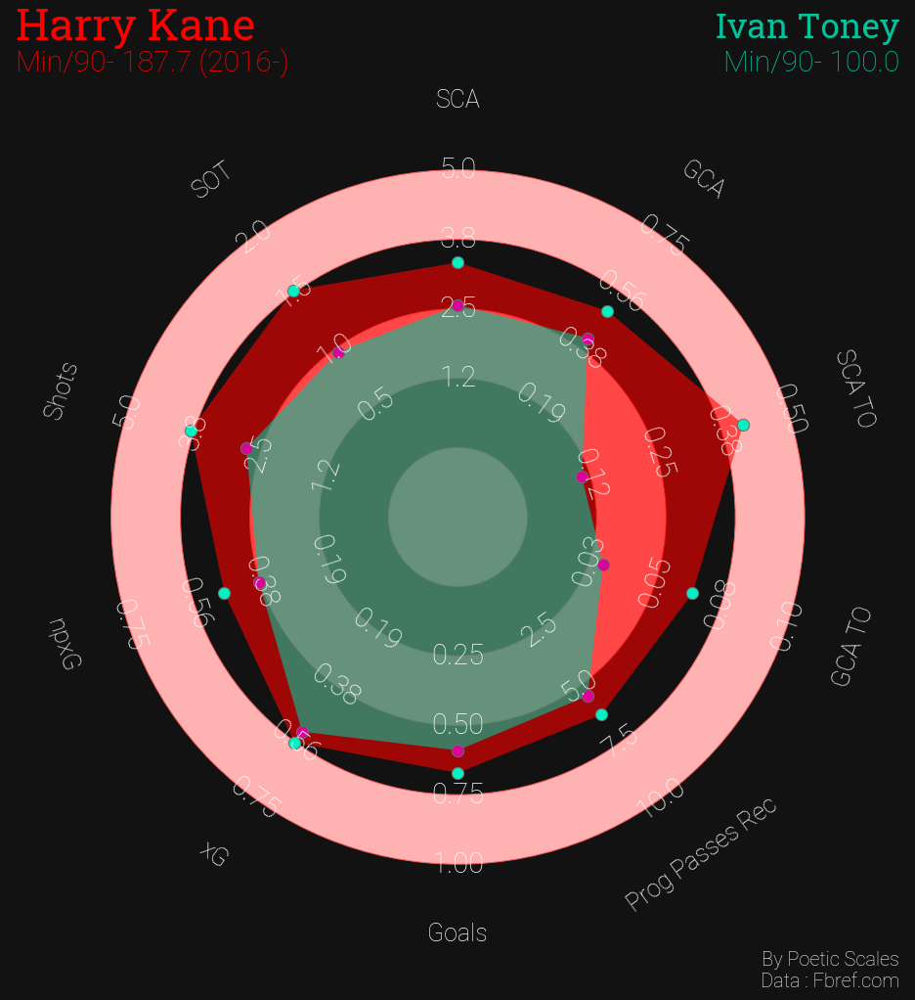

In [56]:
for i in all_players:
    comp_radar_chart(similar_player=i)

# Pass and Carry

In [57]:
final_pass_carry_df.head()

,Player,Nation,Pos,90s,PrgDist of Passes,Ast,xA,KP,Passes in final 3rd,PPA,CrsPA,PrgP,Passes_offside,Passes_Blocked,Carries,PrgDist of Carries,Prog Carries,Carries in 1/3,CPA,Miscontrols,Dispossessed
0,Harry Kane,eng ENG,FW,187.7,16063,33,18.3,230,421,174,22,658,37.0,167.0,4237,9921,371,245,158,427,302
1,Dušan Vlahović,rs SRB,FW,104.5,3163,9,5.4,77,81,47,7,148,7.0,99.0,1878,3442,132,97,58,370,240
2,Randal Kolo Muani,fr FRA,FW,89.5,2617,18,11.6,105,56,40,10,113,9.0,72.0,1747,6217,248,150,148,321,195
3,Loïs Openda,be BEL,FW,85.0,3096,8,8.5,79,62,62,17,114,7.0,60.0,1540,4328,185,106,118,221,97
4,Giacomo Raspadori,it ITA,DF,54.0,3947,4,6.0,83,71,48,2,148,7.0,55.0,1447,2554,85,54,37,155,85


In [58]:
player1_df = final_pass_carry_df.iloc[0:1,3:]
player1_df = player1_df.div(player1_df['90s'],axis=0)
player1_df_value = player1_df.iloc[:,1:].values.tolist()
player1_df_value =player1_df_value[0]
player1_df_value

[85.57805007991476,
 0.17581246670218434,
 0.09749600426212042,
 1.2253596164091636,
 2.242940863079382,
 0.927011188066063,
 0.11720831113478956,
 3.5055940330314335,
 0.19712306872669155,
 0.8897176345231753,
 22.573255194459247,
 52.855620671283965,
 1.9765583377730422,
 1.3052743740010657,
 0.8417687799680341,
 2.274906766116143,
 1.6089504528502931]

In [59]:
player1_df

,90s,PrgDist of Passes,Ast,xA,KP,Passes in final 3rd,PPA,CrsPA,PrgP,Passes_offside,Passes_Blocked,Carries,PrgDist of Carries,Prog Carries,Carries in 1/3,CPA,Miscontrols,Dispossessed
0,1.0,85.57805,0.175812,0.097496,1.22536,2.242941,0.927011,0.117208,3.505594,0.197123,0.889718,22.573255,52.855621,1.976558,1.305274,0.841769,2.274907,1.60895


In [60]:
params = ['PrgDist of Passes','Ast','xA','KP','Passes in final 3rd','PPA','CrsPA','PrgP','Passes_offside','Passes_Blocked',
         'Carries','PrgDist of Carries','Prog Carries','Carries in 1/3','CPA','Miscontrols','Dispossessed']

low = [0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0]
high =[100,0.5,0.1,1.5,3,1,0.5,5,0.5,1,50,75,2,1.5,1,3,2]
len(params),len(low),len(high)

(17, 17, 17)

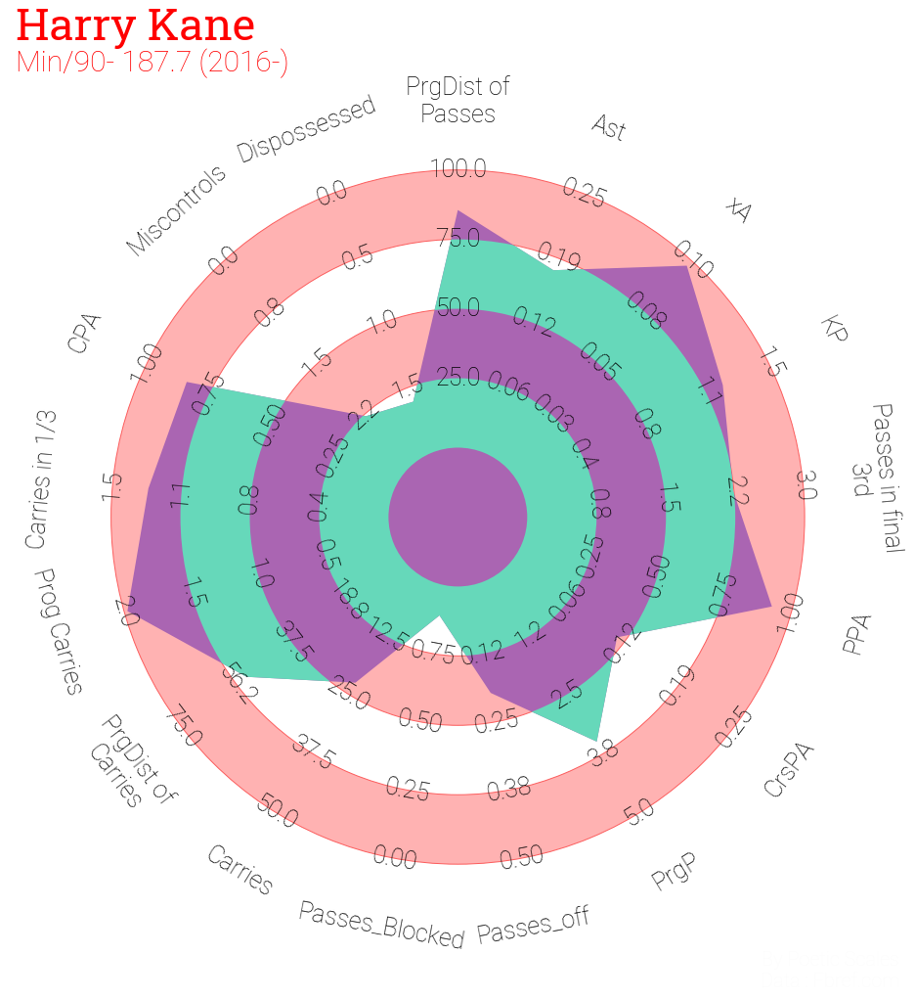

In [66]:
player1_df = final_pass_carry_df.iloc[0:1,3:]
player1_df = player1_df.div(player1_df['90s'],axis=0)
player1_df_value = player1_df.iloc[:,1:].values.tolist()
player1_df_value =player1_df_value[0]
params = ['PrgDist of Passes','Ast','xA','KP','Passes in final 3rd','PPA','CrsPA','PrgP','Passes_off','Passes_Blocked',
         'Carries','PrgDist of Carries','Prog Carries','Carries in 1/3','CPA','Miscontrols','Dispossessed']

low = [0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0]
high =[100,0.25,0.1,1.5,3,1,0.25,5,0.5,1,50,75,2,1.5,1,3,2]

lower_is_better = ['Passes_offside','Passes_Blocked','Miscontrols','Dispossessed']

radar = Radar(params, low, high,lower_is_better=lower_is_better,
          # whether to round any of the labels to integers instead of decimal places
          round_int=[False]*len(params),
          num_rings=4,  # the number of concentric circles (excluding center circle)
          # if the ring_width is more than the center_circle_radius then
          # the center circle radius will be wider than the width of the concentric circles
          ring_width=1, center_circle_radius=1)

fig, axs = grid(figheight=14, grid_height=0.915, title_height=0.06, endnote_height=0.025,
                title_space=0, endnote_space=0, grid_key='radar', axis=False)

# plot the radar
radar.setup_axis(ax=axs['radar'])
rings_inner = radar.draw_circles(ax=axs['radar'], facecolor='#ffb2b2', edgecolor='#fc5f5f')
radar_output = radar.draw_radar(player1_df_value, ax=axs['radar'],
                                kwargs_radar={'facecolor': '#aa65b2'},
                                kwargs_rings={'facecolor': '#66d8ba'})
radar_poly, rings_outer, vertices = radar_output
range_labels = radar.draw_range_labels(ax=axs['radar'], fontsize=25,
                                       fontproperties=robotto_thin.prop)
param_labels = radar.draw_param_labels(ax=axs['radar'], fontsize=25,
                                       fontproperties=robotto_thin.prop)

# adding the endnote and title text (these axes range from 0-1, i.e. 0, 0 is the bottom left)
# Note we are slightly offsetting the text from the edges by 0.01 (1%, e.g. 0.99)
endnote_text = axs['endnote'].text(0.99, 0.9, "By Poetic Scales\nData : Fbref.com", fontsize=20,color='#fcfcfc',
                                       fontproperties=robotto_thin.prop, ha='right', va='center')
title1_text = axs['title'].text(0.01, 0.65, player, fontsize=45, color='red',
                                fontproperties=robotto_bold.prop, ha='left', va='center')

title2_text = axs['title'].text(0.01, 0.05, f"Min/90- {per_90s} (2016-)", fontsize=30,
                            fontproperties=robotto_thin.prop,
                            ha='left', va='center', color='red')
os.chdir(final_pass_carry_dir)
plt.savefig(f"{player}_pass_carry.png")


In [62]:
player1_df

,90s,PrgDist of Passes,Ast,xA,KP,Passes in final 3rd,PPA,CrsPA,PrgP,Passes_offside,Passes_Blocked,Carries,PrgDist of Carries,Prog Carries,Carries in 1/3,CPA,Miscontrols,Dispossessed
0,1.0,85.57805,0.175812,0.097496,1.22536,2.242941,0.927011,0.117208,3.505594,0.197123,0.889718,22.573255,52.855621,1.976558,1.305274,0.841769,2.274907,1.60895


In [67]:
def comp_radar_chart(similar_player):
    player2_df = final_pass_carry_df.loc[df['Player']==similar_player]
    player2_90s = player2_df['90s']
    
    player2_df = player2_df.iloc[:,3:]
    player2_df = player2_df.div(player2_df['90s'],axis=0)
    player2_df_value = player2_df.iloc[:,1:].values.tolist()
    player2_df_value =player2_df_value[0]
    
    
    
    params = ['PrgDist of Passes','Ast','xA','KP','Passes in final 3rd','PPA','CrsPA','PrgP','Passes_off','Passes_Blocked',
         'Carries','PrgDist of Carries','Prog Carries','Carries in 1/3','CPA','Miscontrols','Dispossessed']

    low = [0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0]
    high =[100,0.25,0.1,1.5,3,1,0.25,5,0.5,1,50,75,2,1.5,1,3,2]

    lower_is_better = ['Passes_offside','Passes_Blocked','Miscontrols','Dispossessed']

    radar = Radar(params, low, high,lower_is_better=lower_is_better,
              # whether to round any of the labels to integers instead of decimal places
              round_int=[False]*len(params),
              num_rings=4,  # the number of concentric circles (excluding center circle)
              # if the ring_width is more than the center_circle_radius then
              # the center circle radius will be wider than the width of the concentric circles
              ring_width=1, center_circle_radius=1)
    
    fig, axs = grid(figheight=14, grid_height=0.915, title_height=0.06, endnote_height=0.025,
                title_space=0, endnote_space=0, grid_key='radar', axis=False)

    # plot radar
    radar.setup_axis(ax=axs['radar'],facecolor='None')  # format axis as a radar
    rings_inner = radar.draw_circles(ax=axs['radar'], facecolor='#ffb2b2', edgecolor='#fc5f5f')
    radar_output = radar.draw_radar_compare(player1_df_value,player2_df_value, ax=axs['radar'],
                                            kwargs_radar={'facecolor': 'red', 'alpha': 0.6},
                                            kwargs_compare={'facecolor': '#01c49d', 'alpha': 0.6})
    radar_poly, radar_poly2, vertices1, vertices2 = radar_output
    range_labels = radar.draw_range_labels(ax=axs['radar'], fontsize=29,color='#fcfcfc',
                                           fontproperties=robotto_thin.prop)
    param_labels = radar.draw_param_labels(ax=axs['radar'], fontsize=25,color='#fcfcfc',
                                           fontproperties=robotto_thin.prop)
    axs['radar'].scatter(vertices1[:, 0], vertices1[:, 1],
                         c='#00f2c1', edgecolors='#6d6c6d', marker='o', s=150, zorder=2)
    axs['radar'].scatter(vertices2[:, 0], vertices2[:, 1],
                         c='#d80499', edgecolors='#6d6c6d', marker='o', s=150, zorder=2)

    # adding the endnote and title text (these axes range from 0-1, i.e. 0, 0 is the bottom left)
    # Note we are slightly offsetting the text from the edges by 0.01 (1%, e.g. 0.99)
    endnote_text = axs['endnote'].text(0.99, 0.9, "By Poetic Scales\nData : Fbref.com", fontsize=20,color='#fcfcfc',
                                       fontproperties=robotto_thin.prop, ha='right', va='center')
    title1_text = axs['title'].text(0.01, 0.65, player, fontsize=45, color='red',
                                    fontproperties=robotto_bold.prop, ha='left', va='center')
    
    title2_text = axs['title'].text(0.01, 0.05, f"Min/90- {per_90s} (2016-)", fontsize=30,
                                fontproperties=robotto_thin.prop,
                                ha='left', va='center', color='red')

    title3_text = axs['title'].text(0.99, 0.65, similar_player, fontsize=35,
                                    fontproperties=robotto_bold.prop,
                                    ha='right', va='center', color='#01c49d')
    title4_text = axs['title'].text(0.99, 0.05, f"Min/90- {float(player2_90s)}", fontsize=30,
                                fontproperties=robotto_thin.prop,
                                ha='right', va='center', color='#01c49d')
    fig.set_facecolor('#121212')
    plt.savefig(f"vs {similar_player}_pass_carry.png")

In [68]:
final_pass_carry_df['Player'].unique()

array(['Harry Kane', 'Dušan Vlahović', 'Randal Kolo Muani', 'Loïs Openda',
       'Giacomo Raspadori', 'Josip Brekalo', 'Moise Kean',
       'Jonathan David', 'Dominic Calvert-Lewin', 'Patrik Schick',
       'Tammy Abraham', 'Marcus Thuram', 'Ivan Toney'], dtype=object)

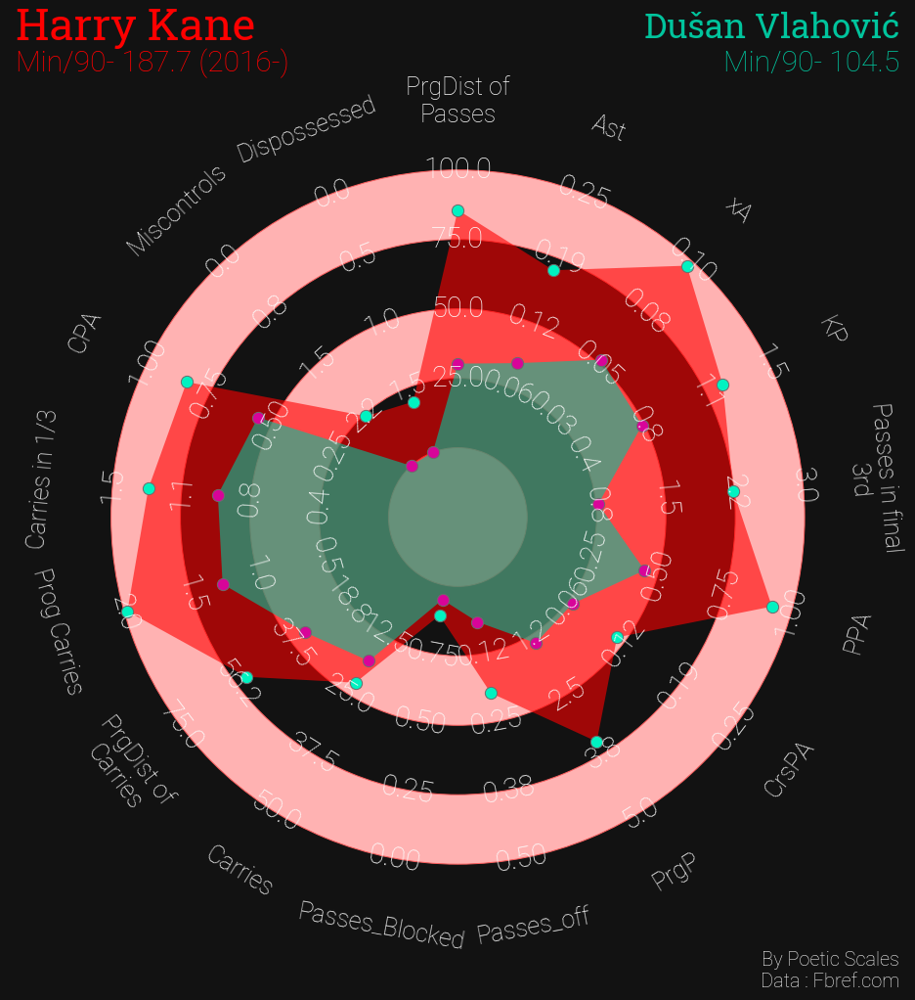

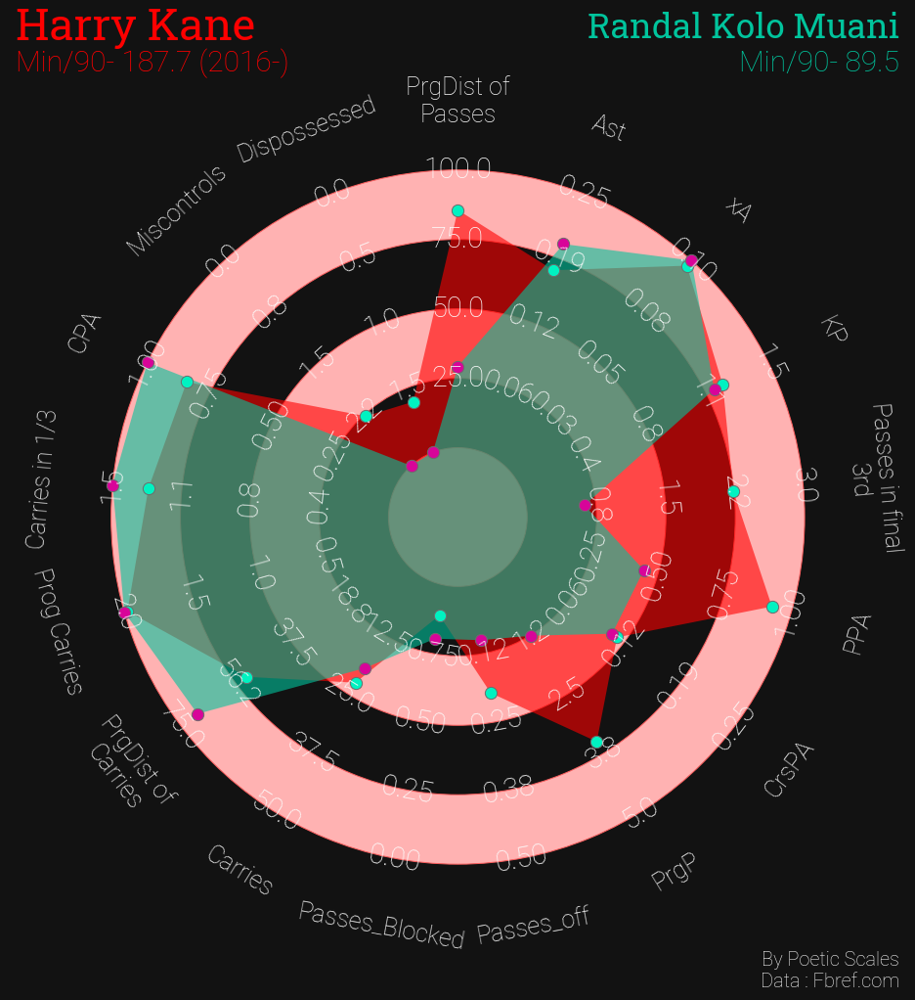

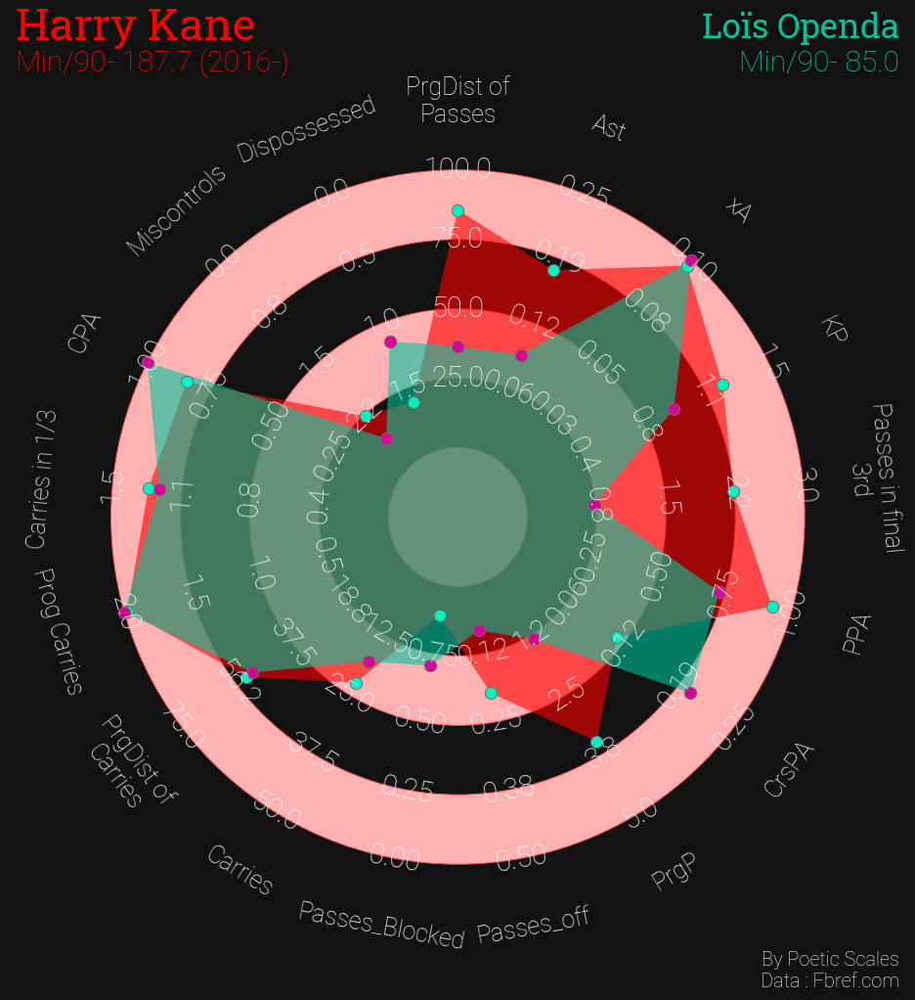

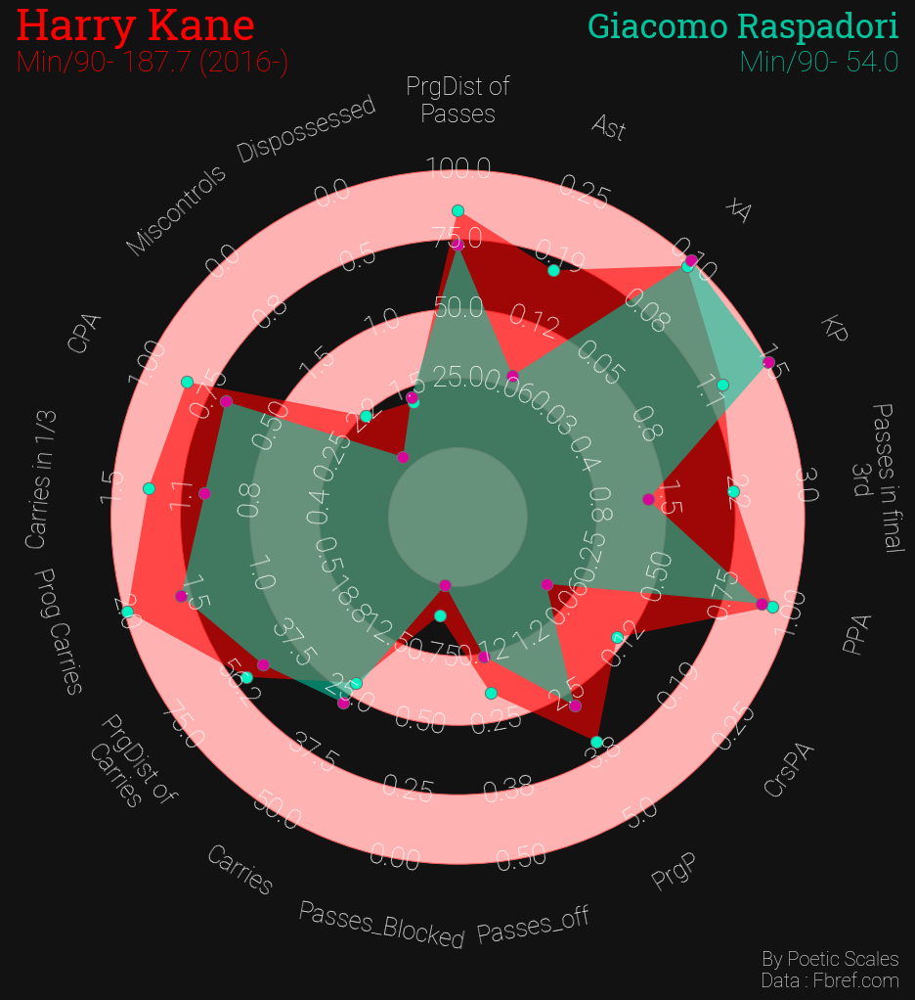

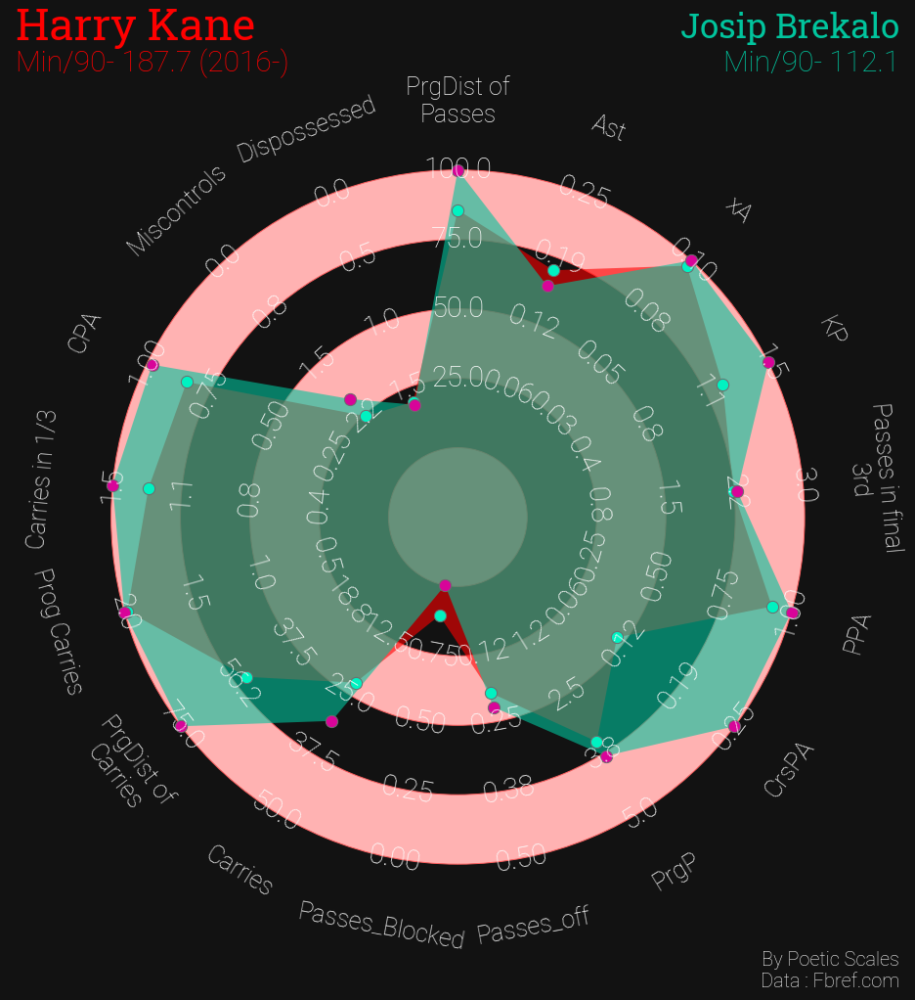

...

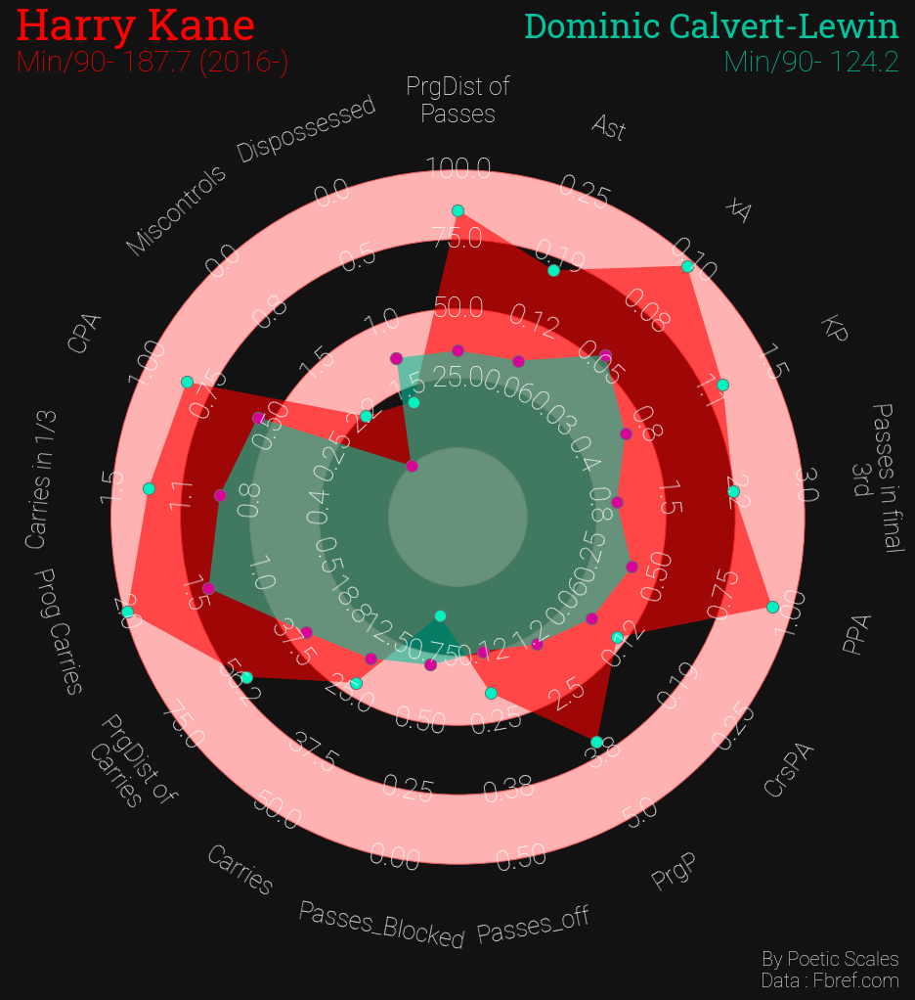

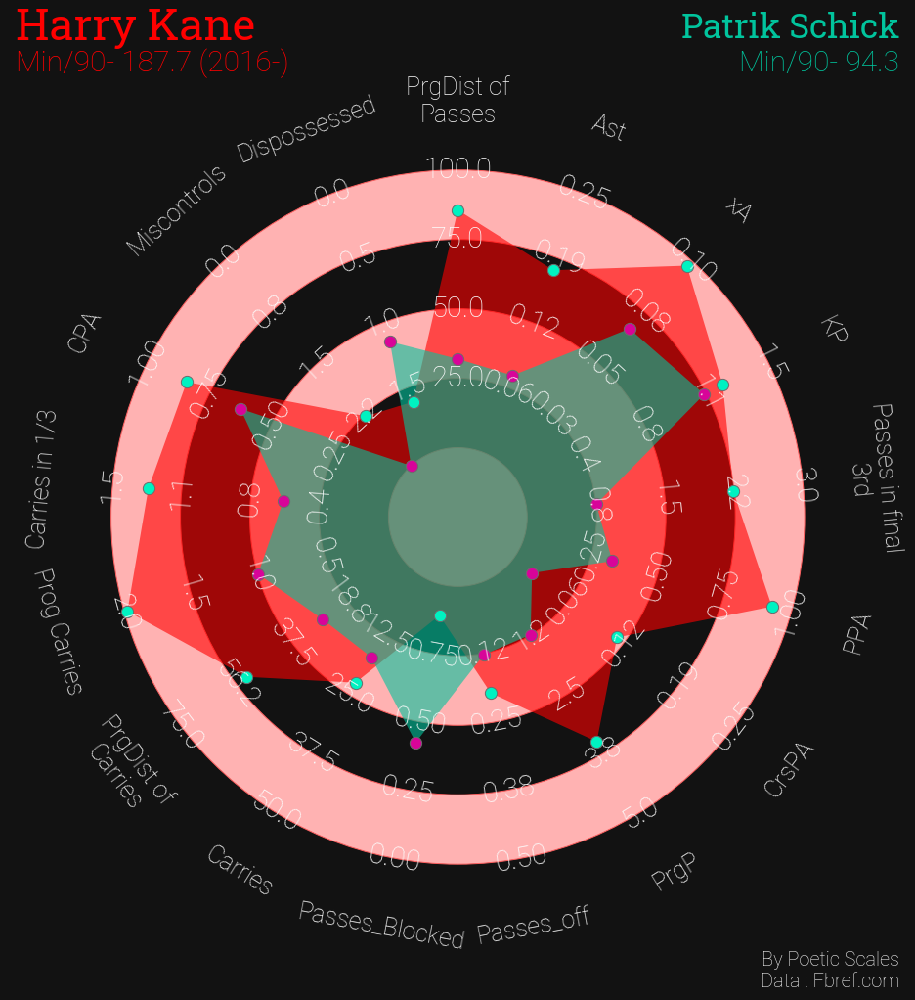

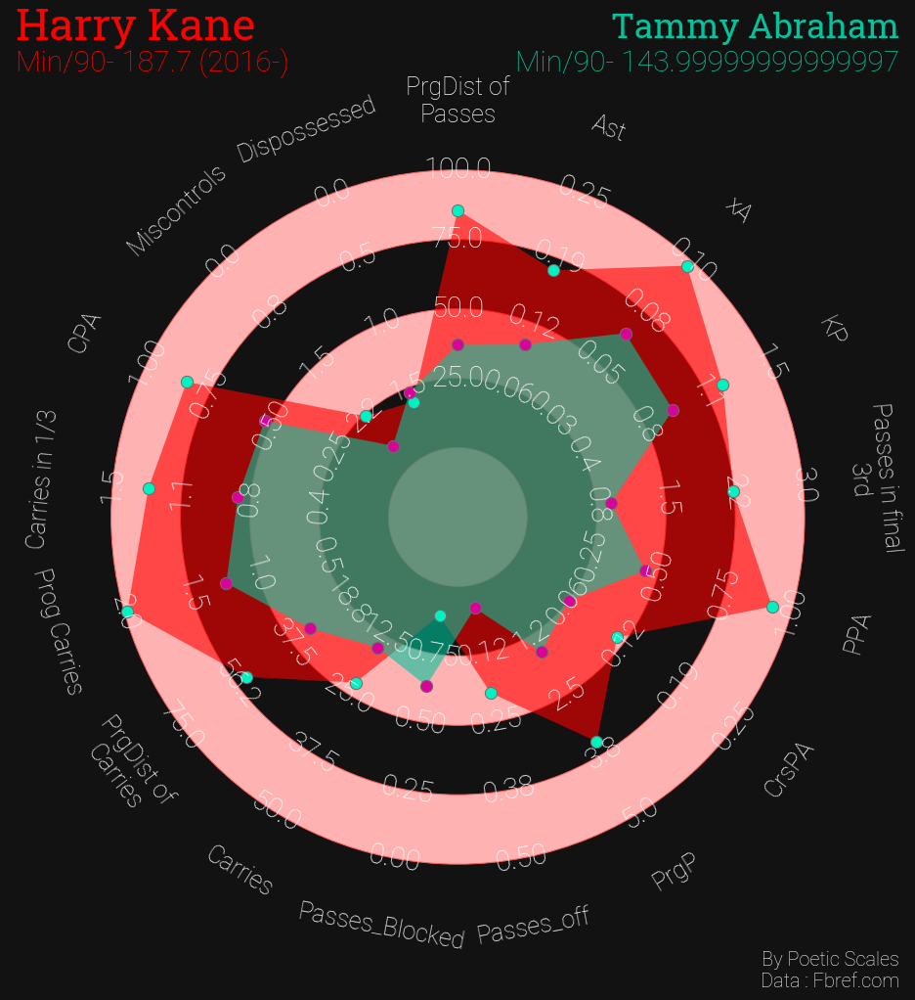

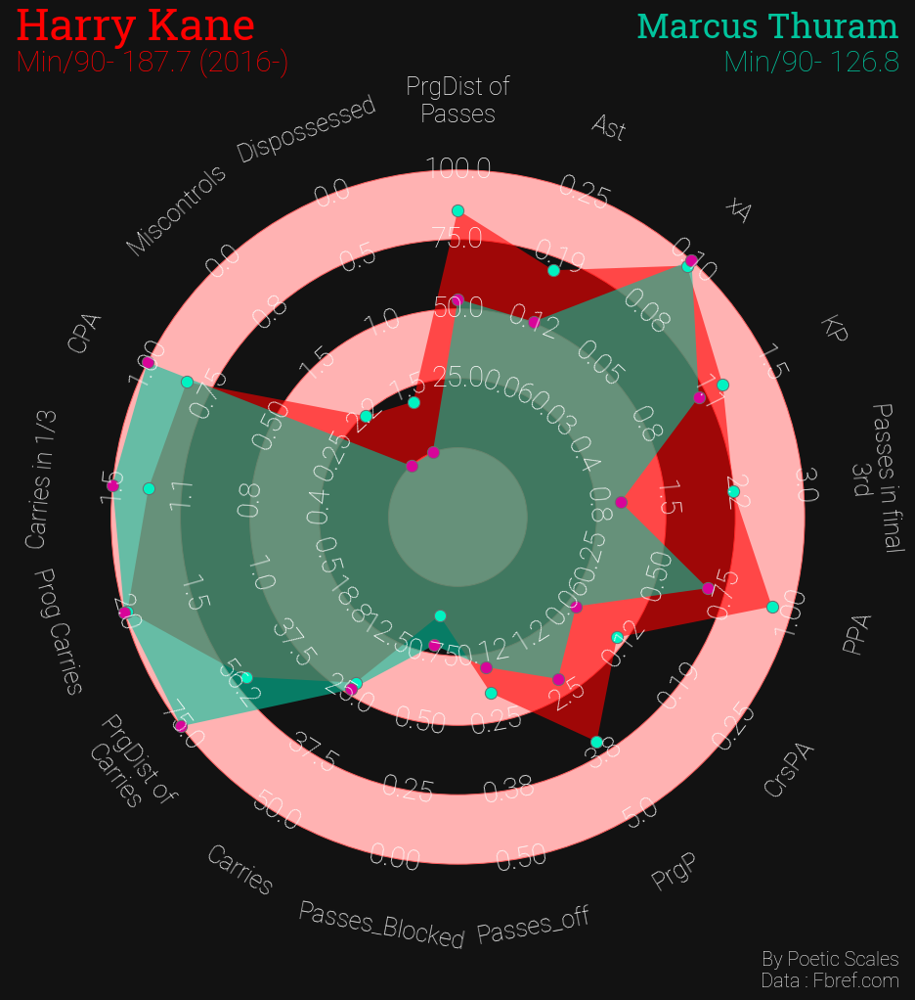

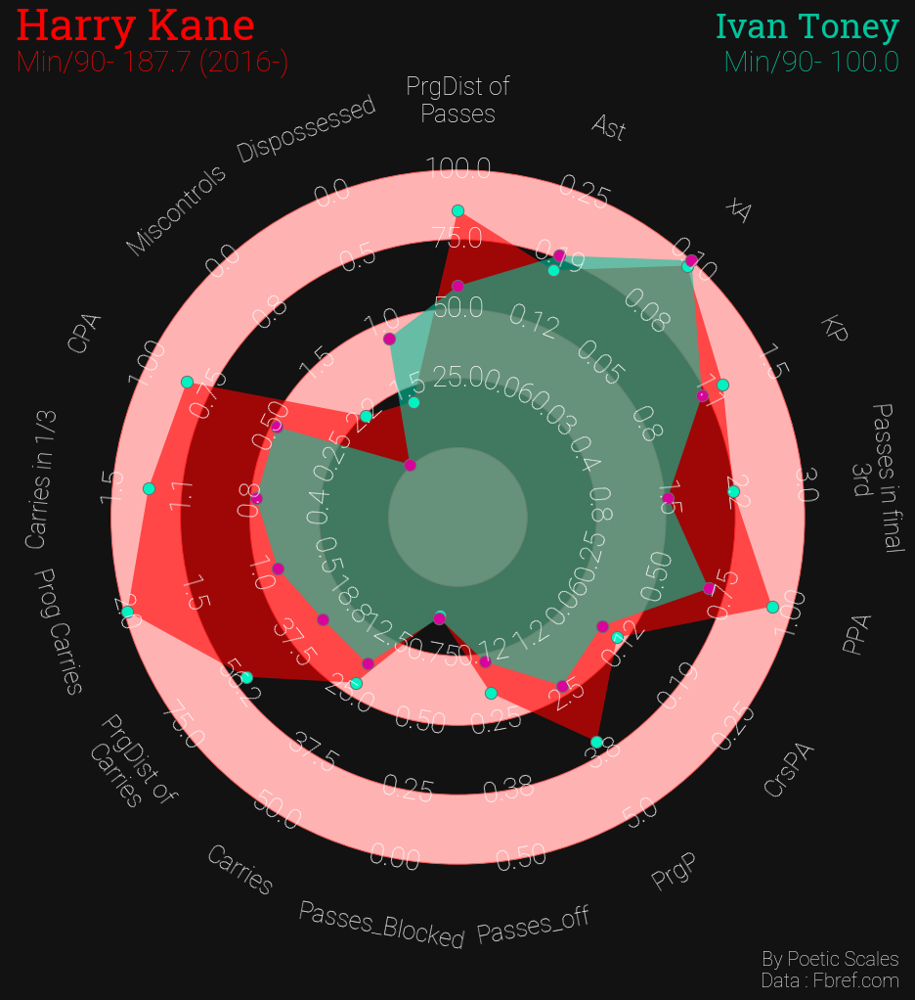

In [69]:
for i in all_players:
    comp_radar_chart(similar_player=i)